In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt 
import numpy as np 

In [16]:
trainset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transforms.ToTensor()
)

transforms.ToTensor() is used to convert the images into tensors (which PyTorch can understand).
MNIST dataset contains handwritten digits (0 to 9), each image is 28x28 pixels in grayscale.
root='./data' specifies where the dataset should be downloaded/stored.
train=True loads the training split.
download=True ensures it gets downloaded if not already present.

transforms.ToTensor(): converts a PIL image or NumPy ndarray (like the ones in the MNIST dataset) into a PyTorch tensor, and also normalizes the pixel values:
Original image pixel values are from 0 to 255.After ToTensor(), they are converted to float values between 0 and 1.



In [17]:
#print(trainset[0])
image,label = trainset[0]
print(image.shape)
print(label)
print(len(trainset))


torch.Size([1, 28, 28])
5
60000


In [18]:
trainloader =torch.utils.data.DataLoader(trainset,batch_size=32,shuffle=True )

In [19]:
class GenBlock(nn.Module):
    def __init__(self, in_features, out_features):
        super(GenBlock,self).__init__()
        self.main = nn.Sequential(
            nn.Linear(in_features, out_features),
            nn.ReLU(True)
        )
    
    def forward(self,x):
        return self.main(x)

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            GenBlock(100, 256),      # Input is a latent vector of size 100
            GenBlock(256, 512),
            GenBlock(512, 1024),
            nn.Linear(1024, 28*28),  # Output a flattened 28x28 image
            nn.Tanh()                # Transform values to the range [-1, 1]
        )

    def forward(self, input):  # Use `input` directly here
        # The input is a latent vector, so no need for `view(-1, 1, 28, 28)`
        output = self.main(input)
        return output.view(-1, 1, 28, 28)  # Reshape to the desired 28x28 image


In [20]:
class DisBlock(nn.Module):
    def __init__(self, in_features, out_features):
        super(DisBlock,self).__init__()
        self.main = nn.Sequential(
            nn.Linear(in_features, out_features),
            nn.LeakyReLU(0.2,True),
            nn.Dropout(0.2)
        )
    
    def forward(self,x):
        return self.main(x)

In [21]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        self.main = nn.Sequential(
            DisBlock(28*28,1024),
            DisBlock(1024,512),
            DisBlock(512,256),
            nn.Linear(256,1),
            nn.Sigmoid()
        )

    def forward(self,input):
        return self.main(input.view(-1,28*28))

In [22]:
generator = Generator()
discriminator = Discriminator()

criterion = nn.BCELoss()

OptimizerG = optim.Adam(generator.parameters(),lr=0.0002)
OptimizerD = optim.Adam(discriminator.parameters(), lr=0.0002)

Epoch [0/80] Batch [0/1875]             Loss D: 1.3597, Loss G: 0.6871
Epoch [0/80] Batch [100/1875]             Loss D: 2.0922, Loss G: 1.5095
Epoch [0/80] Batch [200/1875]             Loss D: 1.1772, Loss G: 0.8246
Epoch [0/80] Batch [300/1875]             Loss D: 1.0175, Loss G: 1.4378
Epoch [0/80] Batch [400/1875]             Loss D: 1.8488, Loss G: 0.3180
Epoch [0/80] Batch [500/1875]             Loss D: 0.6368, Loss G: 3.4020
Epoch [0/80] Batch [600/1875]             Loss D: 0.2850, Loss G: 4.4580
Epoch [0/80] Batch [700/1875]             Loss D: 0.9483, Loss G: 3.4091
Epoch [0/80] Batch [800/1875]             Loss D: 0.3985, Loss G: 2.7195
Epoch [0/80] Batch [900/1875]             Loss D: 0.0700, Loss G: 6.1372
Epoch [0/80] Batch [1000/1875]             Loss D: 2.2189, Loss G: 3.0250
Epoch [0/80] Batch [1100/1875]             Loss D: 0.5812, Loss G: 1.7476
Epoch [0/80] Batch [1200/1875]             Loss D: 1.0965, Loss G: 3.9487
Epoch [0/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15660349..0.5694256].


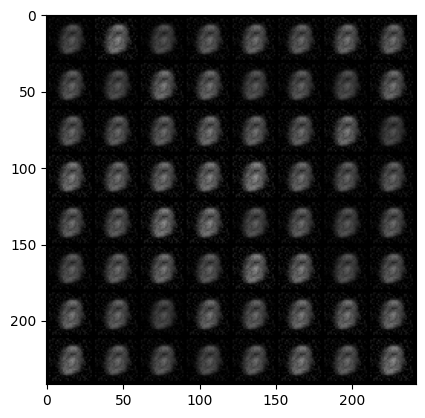

Epoch [1/80] Batch [0/1875]             Loss D: 0.6335, Loss G: 1.4183
Epoch [1/80] Batch [100/1875]             Loss D: 0.0873, Loss G: 3.4613
Epoch [1/80] Batch [200/1875]             Loss D: 0.7828, Loss G: 2.4633
Epoch [1/80] Batch [300/1875]             Loss D: 0.5741, Loss G: 3.8666
Epoch [1/80] Batch [400/1875]             Loss D: 0.6557, Loss G: 3.3577
Epoch [1/80] Batch [500/1875]             Loss D: 0.2530, Loss G: 2.8319
Epoch [1/80] Batch [600/1875]             Loss D: 0.3066, Loss G: 2.4325
Epoch [1/80] Batch [700/1875]             Loss D: 0.9896, Loss G: 2.3244
Epoch [1/80] Batch [800/1875]             Loss D: 0.2906, Loss G: 2.4107
Epoch [1/80] Batch [900/1875]             Loss D: 0.0988, Loss G: 3.3464
Epoch [1/80] Batch [1000/1875]             Loss D: 0.4989, Loss G: 2.4060
Epoch [1/80] Batch [1100/1875]             Loss D: 0.2066, Loss G: 2.4574
Epoch [1/80] Batch [1200/1875]             Loss D: 0.7943, Loss G: 2.5128
Epoch [1/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.60627997..0.9633598].


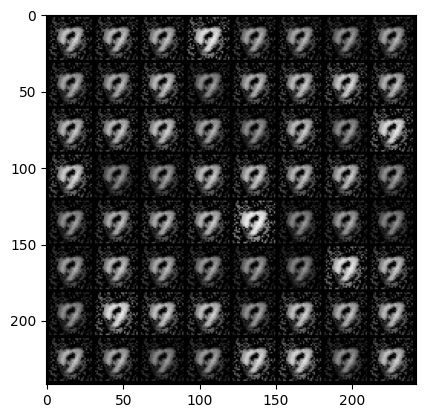

Epoch [2/80] Batch [0/1875]             Loss D: 0.7316, Loss G: 4.7987
Epoch [2/80] Batch [100/1875]             Loss D: 1.7236, Loss G: 2.9269
Epoch [2/80] Batch [200/1875]             Loss D: 0.5894, Loss G: 1.6706
Epoch [2/80] Batch [300/1875]             Loss D: 0.4063, Loss G: 3.2709
Epoch [2/80] Batch [400/1875]             Loss D: 0.1624, Loss G: 3.3129
Epoch [2/80] Batch [500/1875]             Loss D: 0.2482, Loss G: 2.9491
Epoch [2/80] Batch [600/1875]             Loss D: 0.9173, Loss G: 1.9343
Epoch [2/80] Batch [700/1875]             Loss D: 0.2104, Loss G: 2.0450
Epoch [2/80] Batch [800/1875]             Loss D: 0.1403, Loss G: 2.5908
Epoch [2/80] Batch [900/1875]             Loss D: 1.8735, Loss G: 2.1162
Epoch [2/80] Batch [1000/1875]             Loss D: 0.8608, Loss G: 2.1264
Epoch [2/80] Batch [1100/1875]             Loss D: 0.6501, Loss G: 8.7789
Epoch [2/80] Batch [1200/1875]             Loss D: 0.2869, Loss G: 1.9867
Epoch [2/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3947747..0.9267635].


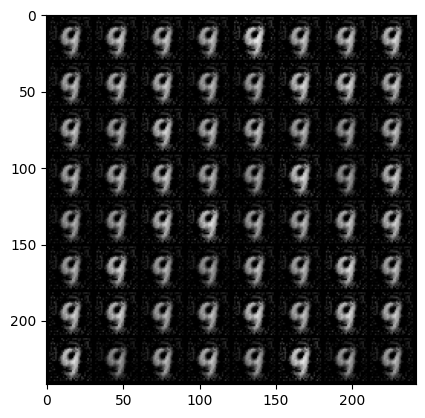

Epoch [3/80] Batch [0/1875]             Loss D: 0.1959, Loss G: 3.6112
Epoch [3/80] Batch [100/1875]             Loss D: 0.6397, Loss G: 5.4152
Epoch [3/80] Batch [200/1875]             Loss D: 0.4952, Loss G: 4.1636
Epoch [3/80] Batch [300/1875]             Loss D: 0.8508, Loss G: 2.0203
Epoch [3/80] Batch [400/1875]             Loss D: 0.4645, Loss G: 2.6789
Epoch [3/80] Batch [500/1875]             Loss D: 0.1723, Loss G: 3.9390
Epoch [3/80] Batch [600/1875]             Loss D: 0.2626, Loss G: 1.9126
Epoch [3/80] Batch [700/1875]             Loss D: 0.2295, Loss G: 5.5359
Epoch [3/80] Batch [800/1875]             Loss D: 1.2683, Loss G: 1.8024
Epoch [3/80] Batch [900/1875]             Loss D: 0.1614, Loss G: 3.0529
Epoch [3/80] Batch [1000/1875]             Loss D: 2.6290, Loss G: 3.8696
Epoch [3/80] Batch [1100/1875]             Loss D: 0.4230, Loss G: 1.8019
Epoch [3/80] Batch [1200/1875]             Loss D: 0.7446, Loss G: 7.6278
Epoch [3/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.80015415..0.99876356].


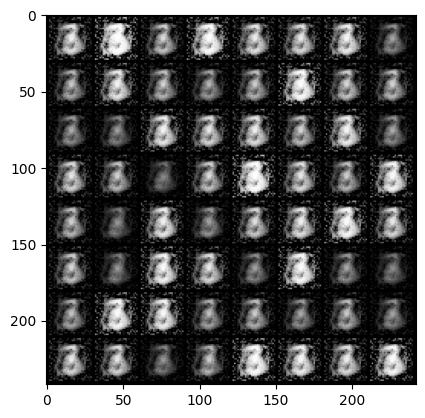

Epoch [4/80] Batch [0/1875]             Loss D: 0.9819, Loss G: 5.2669
Epoch [4/80] Batch [100/1875]             Loss D: 0.2748, Loss G: 2.8948
Epoch [4/80] Batch [200/1875]             Loss D: 0.4097, Loss G: 3.6219
Epoch [4/80] Batch [300/1875]             Loss D: 0.1233, Loss G: 2.5727
Epoch [4/80] Batch [400/1875]             Loss D: 2.5749, Loss G: 6.1304
Epoch [4/80] Batch [500/1875]             Loss D: 0.3390, Loss G: 2.4678
Epoch [4/80] Batch [600/1875]             Loss D: 0.5609, Loss G: 5.1749
Epoch [4/80] Batch [700/1875]             Loss D: 0.7719, Loss G: 3.0980
Epoch [4/80] Batch [800/1875]             Loss D: 2.6594, Loss G: 9.4560
Epoch [4/80] Batch [900/1875]             Loss D: 0.1204, Loss G: 5.5575
Epoch [4/80] Batch [1000/1875]             Loss D: 0.3671, Loss G: 2.6232
Epoch [4/80] Batch [1100/1875]             Loss D: 0.5619, Loss G: 5.3357
Epoch [4/80] Batch [1200/1875]             Loss D: 0.2245, Loss G: 3.2956
Epoch [4/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8808227..0.99987286].


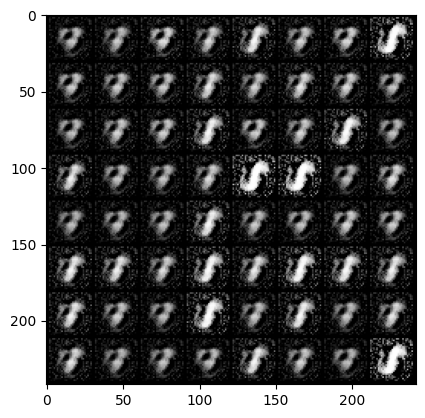

Epoch [5/80] Batch [0/1875]             Loss D: 0.3413, Loss G: 3.3830
Epoch [5/80] Batch [100/1875]             Loss D: 0.3673, Loss G: 2.8513
Epoch [5/80] Batch [200/1875]             Loss D: 0.9216, Loss G: 4.8372
Epoch [5/80] Batch [300/1875]             Loss D: 0.4088, Loss G: 2.1760
Epoch [5/80] Batch [400/1875]             Loss D: 0.1738, Loss G: 2.7773
Epoch [5/80] Batch [500/1875]             Loss D: 0.6695, Loss G: 3.7721
Epoch [5/80] Batch [600/1875]             Loss D: 0.5475, Loss G: 2.8148
Epoch [5/80] Batch [700/1875]             Loss D: 0.2579, Loss G: 3.0739
Epoch [5/80] Batch [800/1875]             Loss D: 0.1734, Loss G: 2.4000
Epoch [5/80] Batch [900/1875]             Loss D: 0.0253, Loss G: 5.1383
Epoch [5/80] Batch [1000/1875]             Loss D: 1.7530, Loss G: 5.5093
Epoch [5/80] Batch [1100/1875]             Loss D: 1.3527, Loss G: 1.3303
Epoch [5/80] Batch [1200/1875]             Loss D: 0.3198, Loss G: 3.5471
Epoch [5/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7458962..0.9985396].


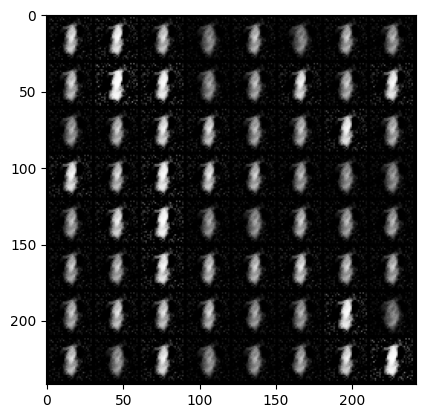

Epoch [6/80] Batch [0/1875]             Loss D: 0.4013, Loss G: 4.7920
Epoch [6/80] Batch [100/1875]             Loss D: 0.1345, Loss G: 3.6304
Epoch [6/80] Batch [200/1875]             Loss D: 0.4349, Loss G: 2.6838
Epoch [6/80] Batch [300/1875]             Loss D: 0.2818, Loss G: 2.1753
Epoch [6/80] Batch [400/1875]             Loss D: 0.5191, Loss G: 4.1050
Epoch [6/80] Batch [500/1875]             Loss D: 0.7929, Loss G: 2.5334
Epoch [6/80] Batch [600/1875]             Loss D: 0.7043, Loss G: 2.8283
Epoch [6/80] Batch [700/1875]             Loss D: 0.8527, Loss G: 1.5765
Epoch [6/80] Batch [800/1875]             Loss D: 0.2810, Loss G: 2.8543
Epoch [6/80] Batch [900/1875]             Loss D: 0.7590, Loss G: 3.8420
Epoch [6/80] Batch [1000/1875]             Loss D: 0.2570, Loss G: 3.5896
Epoch [6/80] Batch [1100/1875]             Loss D: 0.5751, Loss G: 2.7473
Epoch [6/80] Batch [1200/1875]             Loss D: 0.1847, Loss G: 2.2402
Epoch [6/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.87519443..0.99849683].


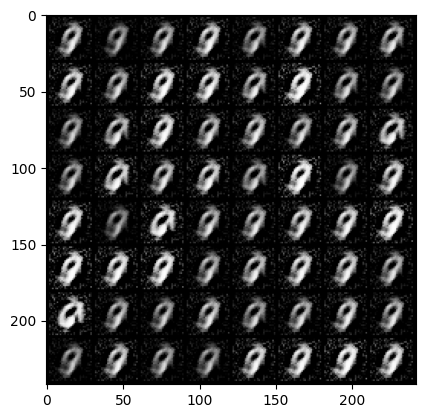

Epoch [7/80] Batch [0/1875]             Loss D: 0.2110, Loss G: 2.8747
Epoch [7/80] Batch [100/1875]             Loss D: 0.4825, Loss G: 2.6083
Epoch [7/80] Batch [200/1875]             Loss D: 0.1833, Loss G: 2.6871
Epoch [7/80] Batch [300/1875]             Loss D: 0.4378, Loss G: 3.5272
Epoch [7/80] Batch [400/1875]             Loss D: 0.5646, Loss G: 2.6644
Epoch [7/80] Batch [500/1875]             Loss D: 0.2195, Loss G: 2.6065
Epoch [7/80] Batch [600/1875]             Loss D: 0.4897, Loss G: 5.2843
Epoch [7/80] Batch [700/1875]             Loss D: 1.0516, Loss G: 3.0116
Epoch [7/80] Batch [800/1875]             Loss D: 0.4124, Loss G: 3.4280
Epoch [7/80] Batch [900/1875]             Loss D: 0.2855, Loss G: 3.5126
Epoch [7/80] Batch [1000/1875]             Loss D: 0.5456, Loss G: 3.3470
Epoch [7/80] Batch [1100/1875]             Loss D: 0.2750, Loss G: 3.3105
Epoch [7/80] Batch [1200/1875]             Loss D: 0.2714, Loss G: 3.2387
Epoch [7/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7321474..0.9916858].


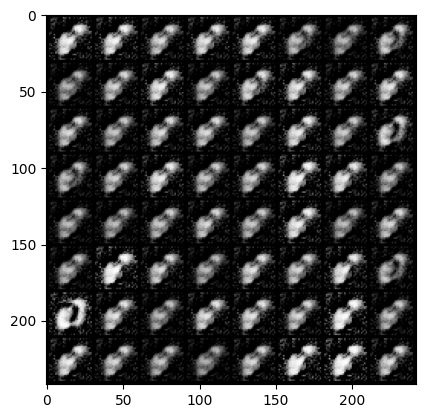

Epoch [8/80] Batch [0/1875]             Loss D: 0.2627, Loss G: 5.6513
Epoch [8/80] Batch [100/1875]             Loss D: 0.9664, Loss G: 2.7172
Epoch [8/80] Batch [200/1875]             Loss D: 0.1306, Loss G: 3.0777
Epoch [8/80] Batch [300/1875]             Loss D: 0.1456, Loss G: 5.2046
Epoch [8/80] Batch [400/1875]             Loss D: 0.2056, Loss G: 3.3501
Epoch [8/80] Batch [500/1875]             Loss D: 0.2785, Loss G: 2.4806
Epoch [8/80] Batch [600/1875]             Loss D: 0.2906, Loss G: 4.7026
Epoch [8/80] Batch [700/1875]             Loss D: 0.4413, Loss G: 2.6645
Epoch [8/80] Batch [800/1875]             Loss D: 0.2016, Loss G: 3.3305
Epoch [8/80] Batch [900/1875]             Loss D: 0.5051, Loss G: 3.1836
Epoch [8/80] Batch [1000/1875]             Loss D: 0.5946, Loss G: 3.0358
Epoch [8/80] Batch [1100/1875]             Loss D: 0.8614, Loss G: 4.1687
Epoch [8/80] Batch [1200/1875]             Loss D: 0.4902, Loss G: 2.1445
Epoch [8/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8431918..0.99945706].


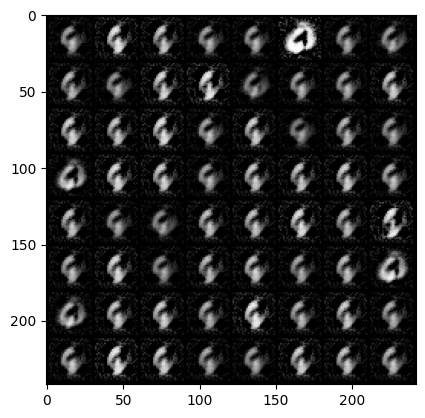

Epoch [9/80] Batch [0/1875]             Loss D: 0.2268, Loss G: 4.7586
Epoch [9/80] Batch [100/1875]             Loss D: 0.1815, Loss G: 2.7220
Epoch [9/80] Batch [200/1875]             Loss D: 0.1176, Loss G: 4.9143
Epoch [9/80] Batch [300/1875]             Loss D: 0.1684, Loss G: 4.1682
Epoch [9/80] Batch [400/1875]             Loss D: 0.6493, Loss G: 3.5036
Epoch [9/80] Batch [500/1875]             Loss D: 1.2265, Loss G: 2.1221
Epoch [9/80] Batch [600/1875]             Loss D: 0.1366, Loss G: 2.7880
Epoch [9/80] Batch [700/1875]             Loss D: 0.2455, Loss G: 3.7198
Epoch [9/80] Batch [800/1875]             Loss D: 0.5171, Loss G: 3.0219
Epoch [9/80] Batch [900/1875]             Loss D: 0.6945, Loss G: 3.9500
Epoch [9/80] Batch [1000/1875]             Loss D: 0.1630, Loss G: 2.7775
Epoch [9/80] Batch [1100/1875]             Loss D: 0.4024, Loss G: 4.9374
Epoch [9/80] Batch [1200/1875]             Loss D: 0.2365, Loss G: 3.8805
Epoch [9/80] Batch [1300/1875]             Loss D:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8407189..0.9817857].


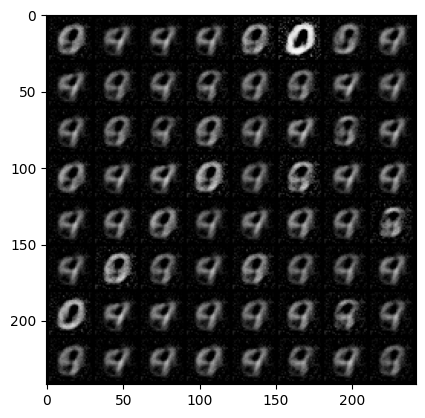

Epoch [10/80] Batch [0/1875]             Loss D: 0.2909, Loss G: 2.8284
Epoch [10/80] Batch [100/1875]             Loss D: 0.3661, Loss G: 6.2431
Epoch [10/80] Batch [200/1875]             Loss D: 0.5487, Loss G: 2.3444
Epoch [10/80] Batch [300/1875]             Loss D: 0.2922, Loss G: 3.5684
Epoch [10/80] Batch [400/1875]             Loss D: 0.7875, Loss G: 3.6784
Epoch [10/80] Batch [500/1875]             Loss D: 0.4127, Loss G: 2.6854
Epoch [10/80] Batch [600/1875]             Loss D: 0.3521, Loss G: 3.4996
Epoch [10/80] Batch [700/1875]             Loss D: 0.3555, Loss G: 2.9191
Epoch [10/80] Batch [800/1875]             Loss D: 0.5468, Loss G: 2.2773
Epoch [10/80] Batch [900/1875]             Loss D: 0.5730, Loss G: 3.3426
Epoch [10/80] Batch [1000/1875]             Loss D: 0.4336, Loss G: 3.0993
Epoch [10/80] Batch [1100/1875]             Loss D: 1.1188, Loss G: 5.0275
Epoch [10/80] Batch [1200/1875]             Loss D: 0.4406, Loss G: 2.4153
Epoch [10/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8006548..0.9798399].


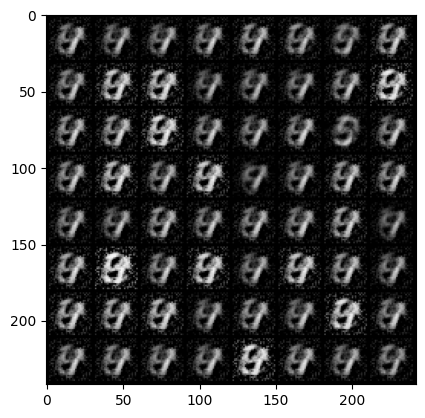

Epoch [11/80] Batch [0/1875]             Loss D: 0.6577, Loss G: 5.3067
Epoch [11/80] Batch [100/1875]             Loss D: 0.6960, Loss G: 4.5364
Epoch [11/80] Batch [200/1875]             Loss D: 0.1678, Loss G: 3.2798
Epoch [11/80] Batch [300/1875]             Loss D: 0.5481, Loss G: 4.2814
Epoch [11/80] Batch [400/1875]             Loss D: 0.1459, Loss G: 5.2785
Epoch [11/80] Batch [500/1875]             Loss D: 0.2919, Loss G: 2.2560
Epoch [11/80] Batch [600/1875]             Loss D: 0.4063, Loss G: 2.3238
Epoch [11/80] Batch [700/1875]             Loss D: 0.4373, Loss G: 4.5967
Epoch [11/80] Batch [800/1875]             Loss D: 0.3654, Loss G: 5.1948
Epoch [11/80] Batch [900/1875]             Loss D: 1.5136, Loss G: 4.8580
Epoch [11/80] Batch [1000/1875]             Loss D: 0.5024, Loss G: 3.3612
Epoch [11/80] Batch [1100/1875]             Loss D: 0.1597, Loss G: 4.0830
Epoch [11/80] Batch [1200/1875]             Loss D: 0.2853, Loss G: 2.7119
Epoch [11/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7227387..0.98423344].


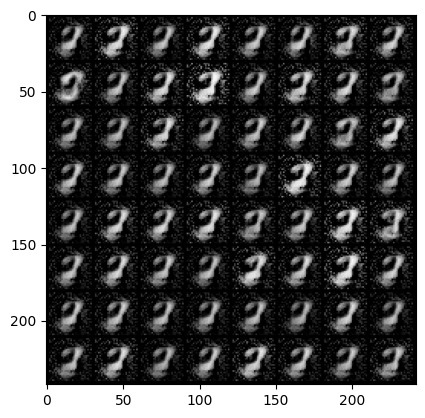

Epoch [12/80] Batch [0/1875]             Loss D: 0.6271, Loss G: 5.6302
Epoch [12/80] Batch [100/1875]             Loss D: 0.3190, Loss G: 4.9270
Epoch [12/80] Batch [200/1875]             Loss D: 0.3365, Loss G: 3.0696
Epoch [12/80] Batch [300/1875]             Loss D: 0.2710, Loss G: 2.8489
Epoch [12/80] Batch [400/1875]             Loss D: 0.4272, Loss G: 4.3318
Epoch [12/80] Batch [500/1875]             Loss D: 0.4149, Loss G: 2.0489
Epoch [12/80] Batch [600/1875]             Loss D: 0.6789, Loss G: 2.9487
Epoch [12/80] Batch [700/1875]             Loss D: 0.1784, Loss G: 4.3823
Epoch [12/80] Batch [800/1875]             Loss D: 0.3573, Loss G: 3.6836
Epoch [12/80] Batch [900/1875]             Loss D: 0.1188, Loss G: 4.4426
Epoch [12/80] Batch [1000/1875]             Loss D: 0.1709, Loss G: 6.7630
Epoch [12/80] Batch [1100/1875]             Loss D: 0.1546, Loss G: 3.6802
Epoch [12/80] Batch [1200/1875]             Loss D: 0.5779, Loss G: 2.7602
Epoch [12/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8950671..0.9993419].


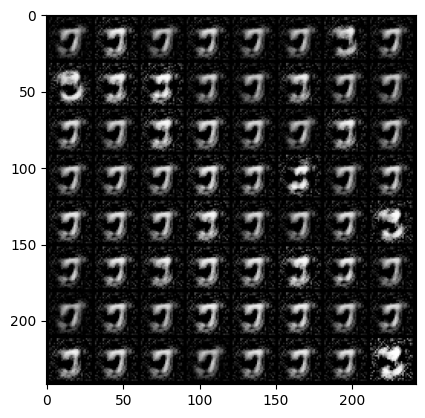

Epoch [13/80] Batch [0/1875]             Loss D: 0.1591, Loss G: 4.9591
Epoch [13/80] Batch [100/1875]             Loss D: 0.9068, Loss G: 6.5033
Epoch [13/80] Batch [200/1875]             Loss D: 0.2721, Loss G: 3.7407
Epoch [13/80] Batch [300/1875]             Loss D: 0.2324, Loss G: 3.5426
Epoch [13/80] Batch [400/1875]             Loss D: 0.7576, Loss G: 3.3001
Epoch [13/80] Batch [500/1875]             Loss D: 0.6161, Loss G: 3.7918
Epoch [13/80] Batch [600/1875]             Loss D: 0.9729, Loss G: 2.3769
Epoch [13/80] Batch [700/1875]             Loss D: 0.4576, Loss G: 2.1563
Epoch [13/80] Batch [800/1875]             Loss D: 0.6723, Loss G: 4.3553
Epoch [13/80] Batch [900/1875]             Loss D: 0.6707, Loss G: 3.2761
Epoch [13/80] Batch [1000/1875]             Loss D: 0.3570, Loss G: 4.3778
Epoch [13/80] Batch [1100/1875]             Loss D: 0.1670, Loss G: 5.4376
Epoch [13/80] Batch [1200/1875]             Loss D: 0.1348, Loss G: 6.5400
Epoch [13/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.941141..0.99615186].


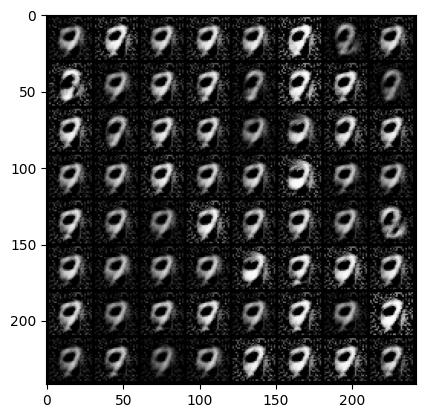

Epoch [14/80] Batch [0/1875]             Loss D: 0.7216, Loss G: 3.8790
Epoch [14/80] Batch [100/1875]             Loss D: 0.3816, Loss G: 2.8232
Epoch [14/80] Batch [200/1875]             Loss D: 0.3281, Loss G: 5.0893
Epoch [14/80] Batch [300/1875]             Loss D: 0.3795, Loss G: 4.9405
Epoch [14/80] Batch [400/1875]             Loss D: 0.2419, Loss G: 4.2533
Epoch [14/80] Batch [500/1875]             Loss D: 0.2517, Loss G: 7.5486
Epoch [14/80] Batch [600/1875]             Loss D: 0.3855, Loss G: 3.2098
Epoch [14/80] Batch [700/1875]             Loss D: 0.2002, Loss G: 3.3811
Epoch [14/80] Batch [800/1875]             Loss D: 0.8713, Loss G: 4.6355
Epoch [14/80] Batch [900/1875]             Loss D: 0.6026, Loss G: 3.9900
Epoch [14/80] Batch [1000/1875]             Loss D: 0.5528, Loss G: 3.1891
Epoch [14/80] Batch [1100/1875]             Loss D: 0.3828, Loss G: 3.6327
Epoch [14/80] Batch [1200/1875]             Loss D: 0.7755, Loss G: 3.6010
Epoch [14/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98911864..0.9999823].


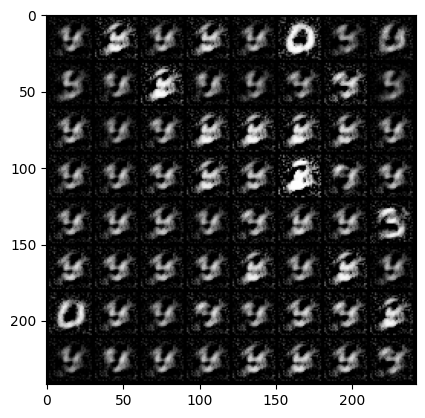

Epoch [15/80] Batch [0/1875]             Loss D: 0.2728, Loss G: 5.6729
Epoch [15/80] Batch [100/1875]             Loss D: 0.6520, Loss G: 5.3172
Epoch [15/80] Batch [200/1875]             Loss D: 0.5721, Loss G: 4.3419
Epoch [15/80] Batch [300/1875]             Loss D: 0.1688, Loss G: 3.2531
Epoch [15/80] Batch [400/1875]             Loss D: 0.6478, Loss G: 3.9932
Epoch [15/80] Batch [500/1875]             Loss D: 0.1496, Loss G: 4.9616
Epoch [15/80] Batch [600/1875]             Loss D: 0.6240, Loss G: 4.0854
Epoch [15/80] Batch [700/1875]             Loss D: 0.4048, Loss G: 2.4650
Epoch [15/80] Batch [800/1875]             Loss D: 1.1059, Loss G: 2.8647
Epoch [15/80] Batch [900/1875]             Loss D: 0.4945, Loss G: 4.5374
Epoch [15/80] Batch [1000/1875]             Loss D: 0.2340, Loss G: 3.5928
Epoch [15/80] Batch [1100/1875]             Loss D: 0.2141, Loss G: 4.3614
Epoch [15/80] Batch [1200/1875]             Loss D: 0.4042, Loss G: 5.4311
Epoch [15/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9316303..0.9990108].


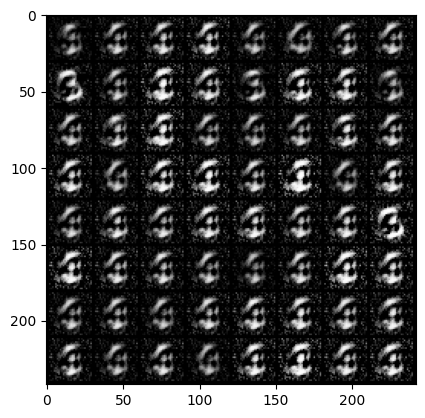

Epoch [16/80] Batch [0/1875]             Loss D: 1.1274, Loss G: 4.2764
Epoch [16/80] Batch [100/1875]             Loss D: 0.4396, Loss G: 3.5535
Epoch [16/80] Batch [200/1875]             Loss D: 0.3773, Loss G: 2.8967
Epoch [16/80] Batch [300/1875]             Loss D: 0.1448, Loss G: 3.1125
Epoch [16/80] Batch [400/1875]             Loss D: 0.2952, Loss G: 5.2269
Epoch [16/80] Batch [500/1875]             Loss D: 0.1206, Loss G: 4.8981
Epoch [16/80] Batch [600/1875]             Loss D: 0.4128, Loss G: 4.9296
Epoch [16/80] Batch [700/1875]             Loss D: 0.4691, Loss G: 3.3108
Epoch [16/80] Batch [800/1875]             Loss D: 0.4403, Loss G: 3.8998
Epoch [16/80] Batch [900/1875]             Loss D: 0.6832, Loss G: 5.0770
Epoch [16/80] Batch [1000/1875]             Loss D: 0.2038, Loss G: 5.8827
Epoch [16/80] Batch [1100/1875]             Loss D: 0.6196, Loss G: 3.4524
Epoch [16/80] Batch [1200/1875]             Loss D: 0.4989, Loss G: 3.0579
Epoch [16/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9620007..0.9994874].


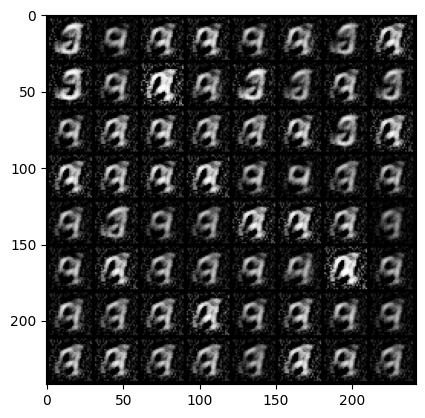

Epoch [17/80] Batch [0/1875]             Loss D: 0.6786, Loss G: 6.4382
Epoch [17/80] Batch [100/1875]             Loss D: 0.2959, Loss G: 4.2681
Epoch [17/80] Batch [200/1875]             Loss D: 0.4592, Loss G: 2.7111
Epoch [17/80] Batch [300/1875]             Loss D: 0.6667, Loss G: 6.8357
Epoch [17/80] Batch [400/1875]             Loss D: 0.6501, Loss G: 3.3457
Epoch [17/80] Batch [500/1875]             Loss D: 0.4707, Loss G: 2.4772
Epoch [17/80] Batch [600/1875]             Loss D: 0.4330, Loss G: 3.4990
Epoch [17/80] Batch [700/1875]             Loss D: 0.2631, Loss G: 4.3331
Epoch [17/80] Batch [800/1875]             Loss D: 0.2394, Loss G: 3.7980
Epoch [17/80] Batch [900/1875]             Loss D: 0.1387, Loss G: 3.6326
Epoch [17/80] Batch [1000/1875]             Loss D: 0.4794, Loss G: 3.5746
Epoch [17/80] Batch [1100/1875]             Loss D: 0.3982, Loss G: 3.4278
Epoch [17/80] Batch [1200/1875]             Loss D: 0.2582, Loss G: 4.5990
Epoch [17/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.83156407..0.98856366].


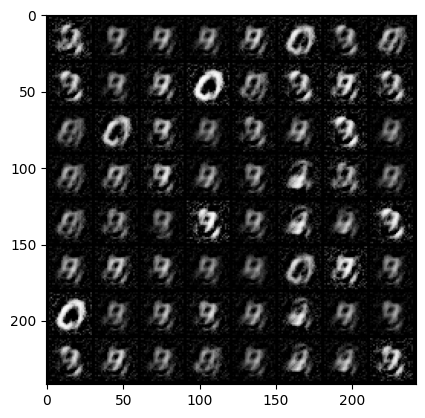

Epoch [18/80] Batch [0/1875]             Loss D: 0.3293, Loss G: 3.2727
Epoch [18/80] Batch [100/1875]             Loss D: 0.3308, Loss G: 3.7118
Epoch [18/80] Batch [200/1875]             Loss D: 0.1388, Loss G: 5.4997
Epoch [18/80] Batch [300/1875]             Loss D: 0.5355, Loss G: 5.1572
Epoch [18/80] Batch [400/1875]             Loss D: 0.8203, Loss G: 3.9250
Epoch [18/80] Batch [500/1875]             Loss D: 0.3114, Loss G: 3.3983
Epoch [18/80] Batch [600/1875]             Loss D: 0.3879, Loss G: 3.4630
Epoch [18/80] Batch [700/1875]             Loss D: 1.0979, Loss G: 3.5674
Epoch [18/80] Batch [800/1875]             Loss D: 0.3723, Loss G: 3.9948
Epoch [18/80] Batch [900/1875]             Loss D: 0.4835, Loss G: 3.5127
Epoch [18/80] Batch [1000/1875]             Loss D: 0.2434, Loss G: 3.8880
Epoch [18/80] Batch [1100/1875]             Loss D: 0.3099, Loss G: 4.7366
Epoch [18/80] Batch [1200/1875]             Loss D: 0.3573, Loss G: 3.5289
Epoch [18/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.81549925..0.99433404].


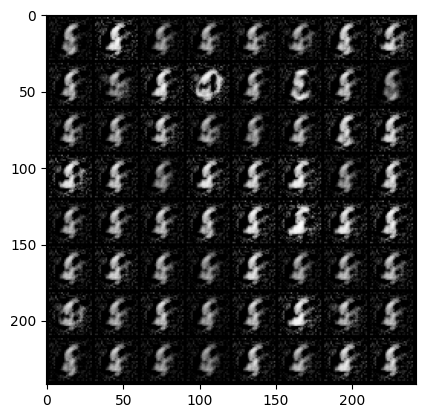

Epoch [19/80] Batch [0/1875]             Loss D: 0.2673, Loss G: 4.3652
Epoch [19/80] Batch [100/1875]             Loss D: 0.2045, Loss G: 3.5483
Epoch [19/80] Batch [200/1875]             Loss D: 0.3031, Loss G: 3.7665
Epoch [19/80] Batch [300/1875]             Loss D: 0.2161, Loss G: 5.1422
Epoch [19/80] Batch [400/1875]             Loss D: 0.2882, Loss G: 4.9443
Epoch [19/80] Batch [500/1875]             Loss D: 0.4745, Loss G: 3.2875
Epoch [19/80] Batch [600/1875]             Loss D: 0.2028, Loss G: 6.4128
Epoch [19/80] Batch [700/1875]             Loss D: 0.1536, Loss G: 4.1804
Epoch [19/80] Batch [800/1875]             Loss D: 0.9835, Loss G: 3.2772
Epoch [19/80] Batch [900/1875]             Loss D: 0.2636, Loss G: 3.4814
Epoch [19/80] Batch [1000/1875]             Loss D: 0.0759, Loss G: 4.1331
Epoch [19/80] Batch [1100/1875]             Loss D: 0.3666, Loss G: 4.6512
Epoch [19/80] Batch [1200/1875]             Loss D: 0.0760, Loss G: 3.5951
Epoch [19/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8676244..0.9962708].


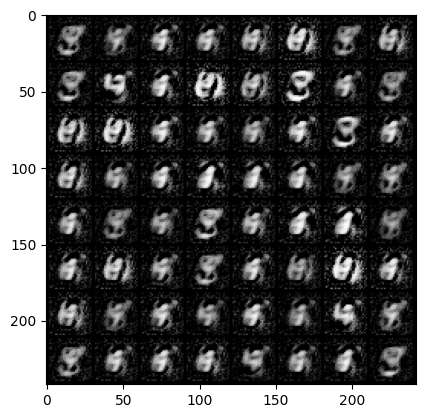

Epoch [20/80] Batch [0/1875]             Loss D: 0.5218, Loss G: 5.5156
Epoch [20/80] Batch [100/1875]             Loss D: 0.2397, Loss G: 4.2256
Epoch [20/80] Batch [200/1875]             Loss D: 0.3395, Loss G: 3.0706
Epoch [20/80] Batch [300/1875]             Loss D: 0.0840, Loss G: 6.0256
Epoch [20/80] Batch [400/1875]             Loss D: 0.3885, Loss G: 2.7090
Epoch [20/80] Batch [500/1875]             Loss D: 0.2243, Loss G: 4.2302
Epoch [20/80] Batch [600/1875]             Loss D: 0.8646, Loss G: 4.2076
Epoch [20/80] Batch [700/1875]             Loss D: 0.2858, Loss G: 6.5396
Epoch [20/80] Batch [800/1875]             Loss D: 1.0736, Loss G: 3.9042
Epoch [20/80] Batch [900/1875]             Loss D: 0.6567, Loss G: 3.3902
Epoch [20/80] Batch [1000/1875]             Loss D: 0.4261, Loss G: 3.3451
Epoch [20/80] Batch [1100/1875]             Loss D: 0.0815, Loss G: 5.2850
Epoch [20/80] Batch [1200/1875]             Loss D: 0.3362, Loss G: 3.7653
Epoch [20/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.62489957..0.9915754].


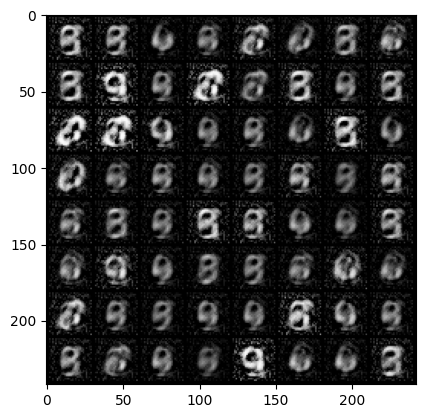

Epoch [21/80] Batch [0/1875]             Loss D: 0.3612, Loss G: 3.9215
Epoch [21/80] Batch [100/1875]             Loss D: 0.2349, Loss G: 3.9125
Epoch [21/80] Batch [200/1875]             Loss D: 0.2006, Loss G: 4.0285
Epoch [21/80] Batch [300/1875]             Loss D: 0.3360, Loss G: 5.4247
Epoch [21/80] Batch [400/1875]             Loss D: 0.6866, Loss G: 4.5619
Epoch [21/80] Batch [500/1875]             Loss D: 0.1813, Loss G: 3.2009
Epoch [21/80] Batch [600/1875]             Loss D: 0.4583, Loss G: 4.6827
Epoch [21/80] Batch [700/1875]             Loss D: 0.4459, Loss G: 4.3345
Epoch [21/80] Batch [800/1875]             Loss D: 0.4175, Loss G: 4.2234
Epoch [21/80] Batch [900/1875]             Loss D: 0.0750, Loss G: 4.4609
Epoch [21/80] Batch [1000/1875]             Loss D: 0.5122, Loss G: 7.3103
Epoch [21/80] Batch [1100/1875]             Loss D: 0.3324, Loss G: 4.3092
Epoch [21/80] Batch [1200/1875]             Loss D: 0.3293, Loss G: 3.4998
Epoch [21/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6995291..0.9977735].


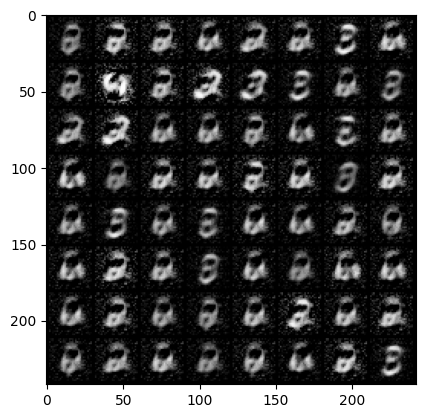

Epoch [22/80] Batch [0/1875]             Loss D: 0.1128, Loss G: 3.3726
Epoch [22/80] Batch [100/1875]             Loss D: 0.4586, Loss G: 5.1668
Epoch [22/80] Batch [200/1875]             Loss D: 0.2794, Loss G: 3.2360
Epoch [22/80] Batch [300/1875]             Loss D: 0.2866, Loss G: 4.5761
Epoch [22/80] Batch [400/1875]             Loss D: 0.4670, Loss G: 4.2822
Epoch [22/80] Batch [500/1875]             Loss D: 0.1942, Loss G: 4.6417
Epoch [22/80] Batch [600/1875]             Loss D: 0.1505, Loss G: 3.1944
Epoch [22/80] Batch [700/1875]             Loss D: 0.3317, Loss G: 4.4901
Epoch [22/80] Batch [800/1875]             Loss D: 0.2130, Loss G: 4.7409
Epoch [22/80] Batch [900/1875]             Loss D: 0.0869, Loss G: 4.5404
Epoch [22/80] Batch [1000/1875]             Loss D: 0.0819, Loss G: 4.0443
Epoch [22/80] Batch [1100/1875]             Loss D: 0.4102, Loss G: 3.9698
Epoch [22/80] Batch [1200/1875]             Loss D: 0.1269, Loss G: 4.3619
Epoch [22/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9655667..0.99962103].


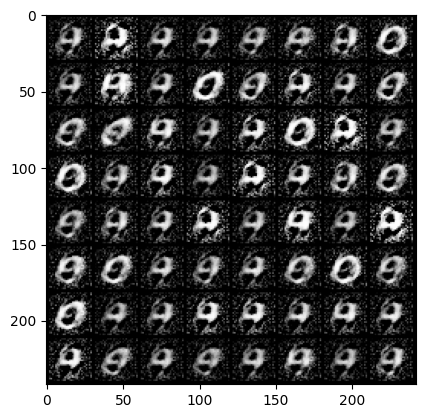

Epoch [23/80] Batch [0/1875]             Loss D: 0.0486, Loss G: 5.4482
Epoch [23/80] Batch [100/1875]             Loss D: 0.6021, Loss G: 5.4163
Epoch [23/80] Batch [200/1875]             Loss D: 0.3999, Loss G: 4.1015
Epoch [23/80] Batch [300/1875]             Loss D: 0.2446, Loss G: 4.0857
Epoch [23/80] Batch [400/1875]             Loss D: 0.1216, Loss G: 4.5972
Epoch [23/80] Batch [500/1875]             Loss D: 0.3082, Loss G: 4.6279
Epoch [23/80] Batch [600/1875]             Loss D: 0.4520, Loss G: 4.7512
Epoch [23/80] Batch [700/1875]             Loss D: 0.4608, Loss G: 4.7927
Epoch [23/80] Batch [800/1875]             Loss D: 0.3147, Loss G: 4.8008
Epoch [23/80] Batch [900/1875]             Loss D: 0.3586, Loss G: 4.4984
Epoch [23/80] Batch [1000/1875]             Loss D: 0.3608, Loss G: 4.0818
Epoch [23/80] Batch [1100/1875]             Loss D: 0.1429, Loss G: 3.5860
Epoch [23/80] Batch [1200/1875]             Loss D: 0.1239, Loss G: 5.8030
Epoch [23/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.77875483..0.99562585].


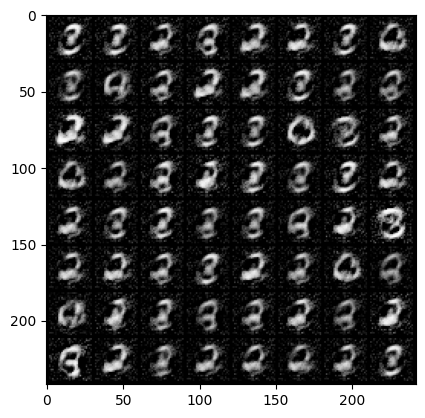

Epoch [24/80] Batch [0/1875]             Loss D: 0.2819, Loss G: 5.1612
Epoch [24/80] Batch [100/1875]             Loss D: 0.2833, Loss G: 4.0265
Epoch [24/80] Batch [200/1875]             Loss D: 0.4541, Loss G: 4.2928
Epoch [24/80] Batch [300/1875]             Loss D: 0.3243, Loss G: 4.7262
Epoch [24/80] Batch [400/1875]             Loss D: 0.5782, Loss G: 4.4128
Epoch [24/80] Batch [500/1875]             Loss D: 0.0572, Loss G: 4.6832
Epoch [24/80] Batch [600/1875]             Loss D: 0.4180, Loss G: 4.1066
Epoch [24/80] Batch [700/1875]             Loss D: 0.3624, Loss G: 3.9981
Epoch [24/80] Batch [800/1875]             Loss D: 0.3077, Loss G: 5.4646
Epoch [24/80] Batch [900/1875]             Loss D: 0.1852, Loss G: 5.9879
Epoch [24/80] Batch [1000/1875]             Loss D: 0.2597, Loss G: 4.5186
Epoch [24/80] Batch [1100/1875]             Loss D: 0.3370, Loss G: 4.9482
Epoch [24/80] Batch [1200/1875]             Loss D: 0.1633, Loss G: 4.5290
Epoch [24/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9232653..0.9989192].


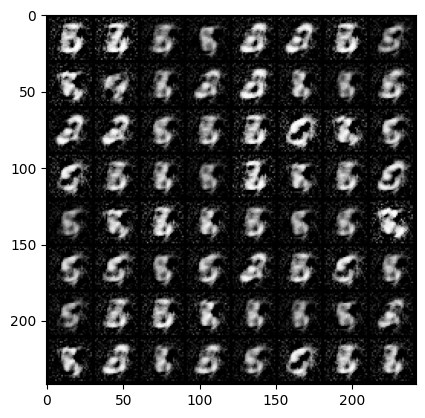

Epoch [25/80] Batch [0/1875]             Loss D: 0.1675, Loss G: 4.4378
Epoch [25/80] Batch [100/1875]             Loss D: 0.1350, Loss G: 4.0717
Epoch [25/80] Batch [200/1875]             Loss D: 0.2506, Loss G: 4.0659
Epoch [25/80] Batch [300/1875]             Loss D: 0.1172, Loss G: 4.0044
Epoch [25/80] Batch [400/1875]             Loss D: 0.2652, Loss G: 6.2234
Epoch [25/80] Batch [500/1875]             Loss D: 0.2434, Loss G: 4.8709
Epoch [25/80] Batch [600/1875]             Loss D: 0.2296, Loss G: 3.6556
Epoch [25/80] Batch [700/1875]             Loss D: 0.0506, Loss G: 4.8756
Epoch [25/80] Batch [800/1875]             Loss D: 0.1513, Loss G: 4.6808
Epoch [25/80] Batch [900/1875]             Loss D: 0.0919, Loss G: 4.6996
Epoch [25/80] Batch [1000/1875]             Loss D: 0.1923, Loss G: 4.0878
Epoch [25/80] Batch [1100/1875]             Loss D: 0.5348, Loss G: 3.4959
Epoch [25/80] Batch [1200/1875]             Loss D: 0.1046, Loss G: 4.9478
Epoch [25/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8419088..0.99571].


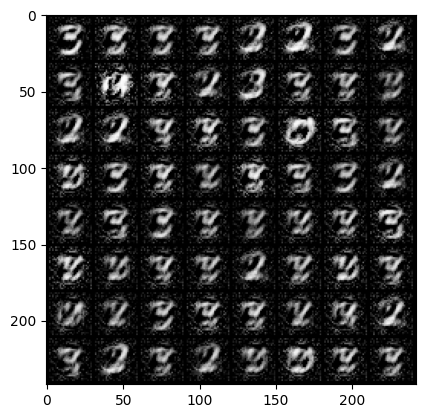

Epoch [26/80] Batch [0/1875]             Loss D: 0.3979, Loss G: 5.1716
Epoch [26/80] Batch [100/1875]             Loss D: 0.6461, Loss G: 3.2147
Epoch [26/80] Batch [200/1875]             Loss D: 0.3019, Loss G: 4.1088
Epoch [26/80] Batch [300/1875]             Loss D: 0.2607, Loss G: 3.3609
Epoch [26/80] Batch [400/1875]             Loss D: 0.0753, Loss G: 4.8697
Epoch [26/80] Batch [500/1875]             Loss D: 0.0734, Loss G: 3.9124
Epoch [26/80] Batch [600/1875]             Loss D: 0.2087, Loss G: 4.7484
Epoch [26/80] Batch [700/1875]             Loss D: 0.1703, Loss G: 4.5247
Epoch [26/80] Batch [800/1875]             Loss D: 0.3035, Loss G: 4.2959
Epoch [26/80] Batch [900/1875]             Loss D: 0.1382, Loss G: 5.4914
Epoch [26/80] Batch [1000/1875]             Loss D: 0.2810, Loss G: 4.3354
Epoch [26/80] Batch [1100/1875]             Loss D: 0.2012, Loss G: 4.7082
Epoch [26/80] Batch [1200/1875]             Loss D: 0.2537, Loss G: 5.2315
Epoch [26/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.88571876..0.9996555].


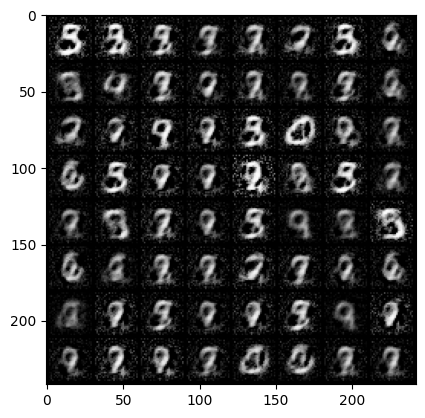

Epoch [27/80] Batch [0/1875]             Loss D: 0.4571, Loss G: 3.9962
Epoch [27/80] Batch [100/1875]             Loss D: 0.1979, Loss G: 3.7765
Epoch [27/80] Batch [200/1875]             Loss D: 0.1691, Loss G: 3.9912
Epoch [27/80] Batch [300/1875]             Loss D: 0.4145, Loss G: 4.3896
Epoch [27/80] Batch [400/1875]             Loss D: 0.6261, Loss G: 4.8944
Epoch [27/80] Batch [500/1875]             Loss D: 0.3661, Loss G: 4.3774
Epoch [27/80] Batch [600/1875]             Loss D: 0.1128, Loss G: 4.0860
Epoch [27/80] Batch [700/1875]             Loss D: 0.2375, Loss G: 4.7403
Epoch [27/80] Batch [800/1875]             Loss D: 0.2894, Loss G: 4.8250
Epoch [27/80] Batch [900/1875]             Loss D: 0.4265, Loss G: 5.5758
Epoch [27/80] Batch [1000/1875]             Loss D: 0.3045, Loss G: 3.1270
Epoch [27/80] Batch [1100/1875]             Loss D: 0.2792, Loss G: 4.3844
Epoch [27/80] Batch [1200/1875]             Loss D: 0.2285, Loss G: 3.3483
Epoch [27/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9034221..0.99983394].


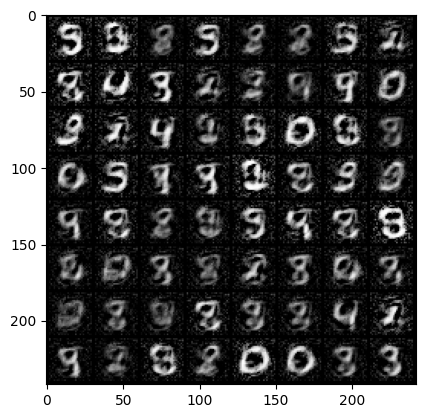

Epoch [28/80] Batch [0/1875]             Loss D: 0.3086, Loss G: 3.8489
Epoch [28/80] Batch [100/1875]             Loss D: 0.2230, Loss G: 3.8391
Epoch [28/80] Batch [200/1875]             Loss D: 0.2099, Loss G: 5.0202
Epoch [28/80] Batch [300/1875]             Loss D: 0.2776, Loss G: 3.3643
Epoch [28/80] Batch [400/1875]             Loss D: 0.1251, Loss G: 4.5202
Epoch [28/80] Batch [500/1875]             Loss D: 0.4375, Loss G: 4.6459
Epoch [28/80] Batch [600/1875]             Loss D: 0.1644, Loss G: 4.4198
Epoch [28/80] Batch [700/1875]             Loss D: 0.2479, Loss G: 3.7955
Epoch [28/80] Batch [800/1875]             Loss D: 0.2564, Loss G: 4.6210
Epoch [28/80] Batch [900/1875]             Loss D: 0.2293, Loss G: 4.7905
Epoch [28/80] Batch [1000/1875]             Loss D: 0.3308, Loss G: 3.9666
Epoch [28/80] Batch [1100/1875]             Loss D: 0.4533, Loss G: 4.6094
Epoch [28/80] Batch [1200/1875]             Loss D: 0.1919, Loss G: 4.0457
Epoch [28/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9880507..0.99985975].


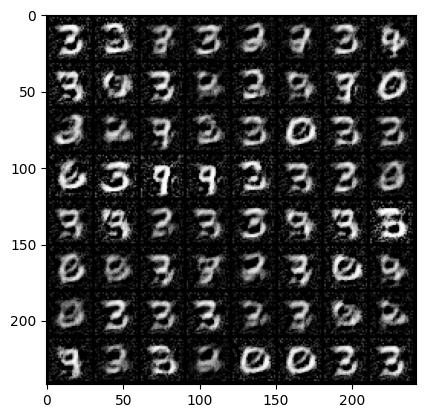

Epoch [29/80] Batch [0/1875]             Loss D: 0.0705, Loss G: 4.3071
Epoch [29/80] Batch [100/1875]             Loss D: 0.3671, Loss G: 3.2502
Epoch [29/80] Batch [200/1875]             Loss D: 0.2884, Loss G: 5.0422
Epoch [29/80] Batch [300/1875]             Loss D: 0.2443, Loss G: 3.5934
Epoch [29/80] Batch [400/1875]             Loss D: 0.3615, Loss G: 3.3628
Epoch [29/80] Batch [500/1875]             Loss D: 0.4357, Loss G: 3.9029
Epoch [29/80] Batch [600/1875]             Loss D: 0.1025, Loss G: 3.6458
Epoch [29/80] Batch [700/1875]             Loss D: 0.3041, Loss G: 3.5311
Epoch [29/80] Batch [800/1875]             Loss D: 0.1662, Loss G: 5.7773
Epoch [29/80] Batch [900/1875]             Loss D: 0.1479, Loss G: 3.2761
Epoch [29/80] Batch [1000/1875]             Loss D: 0.2725, Loss G: 3.6130
Epoch [29/80] Batch [1100/1875]             Loss D: 0.2134, Loss G: 4.1050
Epoch [29/80] Batch [1200/1875]             Loss D: 0.3823, Loss G: 3.4821
Epoch [29/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9370854..0.99975204].


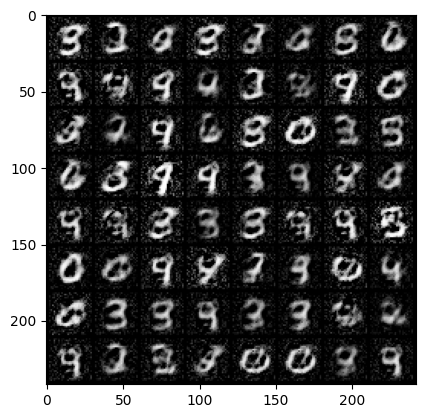

Epoch [30/80] Batch [0/1875]             Loss D: 0.2539, Loss G: 3.2769
Epoch [30/80] Batch [100/1875]             Loss D: 0.2478, Loss G: 3.2681
Epoch [30/80] Batch [200/1875]             Loss D: 0.3179, Loss G: 4.5511
Epoch [30/80] Batch [300/1875]             Loss D: 0.0785, Loss G: 7.5174
Epoch [30/80] Batch [400/1875]             Loss D: 0.4636, Loss G: 3.8891
Epoch [30/80] Batch [500/1875]             Loss D: 0.6161, Loss G: 4.0628
Epoch [30/80] Batch [600/1875]             Loss D: 0.3052, Loss G: 3.7812
Epoch [30/80] Batch [700/1875]             Loss D: 0.4096, Loss G: 4.0090
Epoch [30/80] Batch [800/1875]             Loss D: 0.3295, Loss G: 3.6737
Epoch [30/80] Batch [900/1875]             Loss D: 0.5209, Loss G: 3.6237
Epoch [30/80] Batch [1000/1875]             Loss D: 0.2883, Loss G: 3.5908
Epoch [30/80] Batch [1100/1875]             Loss D: 0.1348, Loss G: 5.0555
Epoch [30/80] Batch [1200/1875]             Loss D: 0.3753, Loss G: 5.1742
Epoch [30/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.90985036..0.9992786].


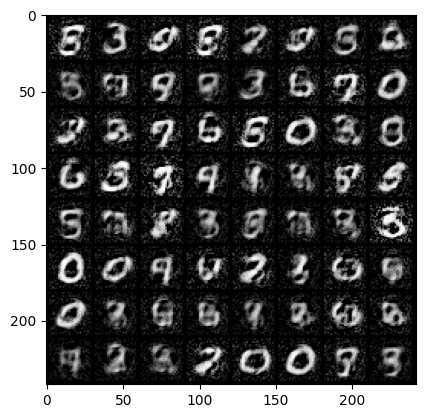

Epoch [31/80] Batch [0/1875]             Loss D: 0.5772, Loss G: 3.2341
Epoch [31/80] Batch [100/1875]             Loss D: 0.3860, Loss G: 3.9813
Epoch [31/80] Batch [200/1875]             Loss D: 0.3421, Loss G: 3.0255
Epoch [31/80] Batch [300/1875]             Loss D: 0.2620, Loss G: 3.0174
Epoch [31/80] Batch [400/1875]             Loss D: 0.1735, Loss G: 3.7343
Epoch [31/80] Batch [500/1875]             Loss D: 0.2756, Loss G: 3.9387
Epoch [31/80] Batch [600/1875]             Loss D: 0.3388, Loss G: 3.5499
Epoch [31/80] Batch [700/1875]             Loss D: 0.2997, Loss G: 4.5331
Epoch [31/80] Batch [800/1875]             Loss D: 0.3923, Loss G: 3.4149
Epoch [31/80] Batch [900/1875]             Loss D: 0.0934, Loss G: 4.0188
Epoch [31/80] Batch [1000/1875]             Loss D: 0.2055, Loss G: 3.7297
Epoch [31/80] Batch [1100/1875]             Loss D: 0.7650, Loss G: 3.8831
Epoch [31/80] Batch [1200/1875]             Loss D: 0.4306, Loss G: 2.9544
Epoch [31/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9006493..0.99808884].


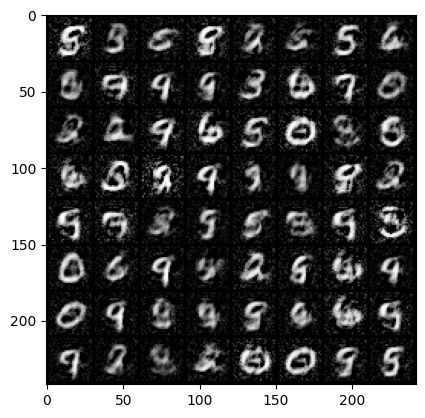

Epoch [32/80] Batch [0/1875]             Loss D: 0.2499, Loss G: 3.7578
Epoch [32/80] Batch [100/1875]             Loss D: 0.4415, Loss G: 3.3989
Epoch [32/80] Batch [200/1875]             Loss D: 0.2403, Loss G: 3.4751
Epoch [32/80] Batch [300/1875]             Loss D: 0.3011, Loss G: 4.4836
Epoch [32/80] Batch [400/1875]             Loss D: 0.3684, Loss G: 3.7231
Epoch [32/80] Batch [500/1875]             Loss D: 0.4762, Loss G: 3.9848
Epoch [32/80] Batch [600/1875]             Loss D: 0.4300, Loss G: 3.7805
Epoch [32/80] Batch [700/1875]             Loss D: 0.2844, Loss G: 3.9853
Epoch [32/80] Batch [800/1875]             Loss D: 0.2406, Loss G: 4.1572
Epoch [32/80] Batch [900/1875]             Loss D: 0.2028, Loss G: 3.9666
Epoch [32/80] Batch [1000/1875]             Loss D: 0.4678, Loss G: 3.4288
Epoch [32/80] Batch [1100/1875]             Loss D: 0.3632, Loss G: 3.5634
Epoch [32/80] Batch [1200/1875]             Loss D: 0.2563, Loss G: 4.4376
Epoch [32/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.87005925..0.99965113].


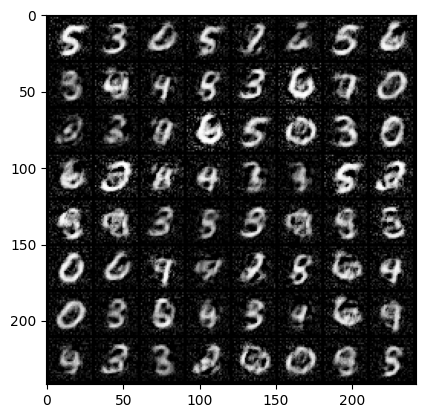

Epoch [33/80] Batch [0/1875]             Loss D: 0.2405, Loss G: 3.1814
Epoch [33/80] Batch [100/1875]             Loss D: 0.4666, Loss G: 4.5144
Epoch [33/80] Batch [200/1875]             Loss D: 0.6498, Loss G: 2.7845
Epoch [33/80] Batch [300/1875]             Loss D: 0.4341, Loss G: 4.1930
Epoch [33/80] Batch [400/1875]             Loss D: 0.2270, Loss G: 3.2506
Epoch [33/80] Batch [500/1875]             Loss D: 0.5688, Loss G: 4.2078
Epoch [33/80] Batch [600/1875]             Loss D: 0.4470, Loss G: 3.3902
Epoch [33/80] Batch [700/1875]             Loss D: 0.7009, Loss G: 3.5298
Epoch [33/80] Batch [800/1875]             Loss D: 0.3177, Loss G: 4.2942
Epoch [33/80] Batch [900/1875]             Loss D: 0.1725, Loss G: 3.7217
Epoch [33/80] Batch [1000/1875]             Loss D: 0.2652, Loss G: 3.9137
Epoch [33/80] Batch [1100/1875]             Loss D: 0.3225, Loss G: 4.8227
Epoch [33/80] Batch [1200/1875]             Loss D: 0.4016, Loss G: 2.9871
Epoch [33/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.88325375..0.99851584].


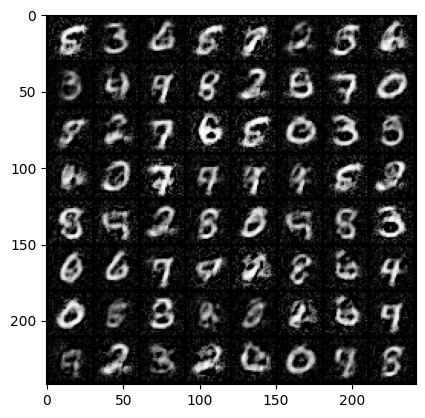

Epoch [34/80] Batch [0/1875]             Loss D: 0.2484, Loss G: 3.5735
Epoch [34/80] Batch [100/1875]             Loss D: 0.3288, Loss G: 3.2990
Epoch [34/80] Batch [200/1875]             Loss D: 0.2194, Loss G: 3.6844
Epoch [34/80] Batch [300/1875]             Loss D: 0.2085, Loss G: 4.0442
Epoch [34/80] Batch [400/1875]             Loss D: 0.3763, Loss G: 3.9742
Epoch [34/80] Batch [500/1875]             Loss D: 0.6645, Loss G: 3.8938
Epoch [34/80] Batch [600/1875]             Loss D: 0.3299, Loss G: 3.5093
Epoch [34/80] Batch [700/1875]             Loss D: 0.5455, Loss G: 3.0161
Epoch [34/80] Batch [800/1875]             Loss D: 0.1606, Loss G: 3.7632
Epoch [34/80] Batch [900/1875]             Loss D: 0.1398, Loss G: 4.1270
Epoch [34/80] Batch [1000/1875]             Loss D: 0.3083, Loss G: 3.6854
Epoch [34/80] Batch [1100/1875]             Loss D: 0.4064, Loss G: 3.7402
Epoch [34/80] Batch [1200/1875]             Loss D: 0.2230, Loss G: 3.4284
Epoch [34/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.84119475..0.99878275].


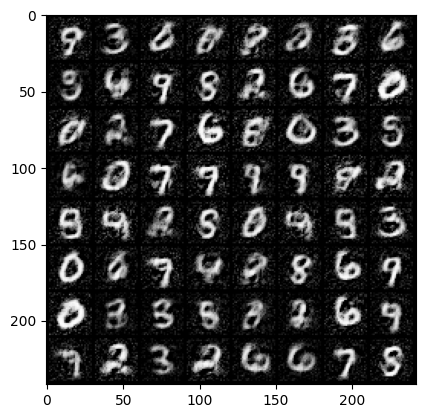

Epoch [35/80] Batch [0/1875]             Loss D: 0.3153, Loss G: 2.7849
Epoch [35/80] Batch [100/1875]             Loss D: 0.4297, Loss G: 3.6145
Epoch [35/80] Batch [200/1875]             Loss D: 0.2885, Loss G: 3.3807
Epoch [35/80] Batch [300/1875]             Loss D: 0.1256, Loss G: 3.7319
Epoch [35/80] Batch [400/1875]             Loss D: 0.1954, Loss G: 4.5968
Epoch [35/80] Batch [500/1875]             Loss D: 0.3887, Loss G: 3.2993
Epoch [35/80] Batch [600/1875]             Loss D: 0.3639, Loss G: 3.3061
Epoch [35/80] Batch [700/1875]             Loss D: 0.2726, Loss G: 4.4247
Epoch [35/80] Batch [800/1875]             Loss D: 0.5535, Loss G: 3.4811
Epoch [35/80] Batch [900/1875]             Loss D: 0.2859, Loss G: 4.8226
Epoch [35/80] Batch [1000/1875]             Loss D: 0.3159, Loss G: 3.1732
Epoch [35/80] Batch [1100/1875]             Loss D: 0.3936, Loss G: 3.2194
Epoch [35/80] Batch [1200/1875]             Loss D: 0.4555, Loss G: 3.0756
Epoch [35/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91738486..0.99964076].


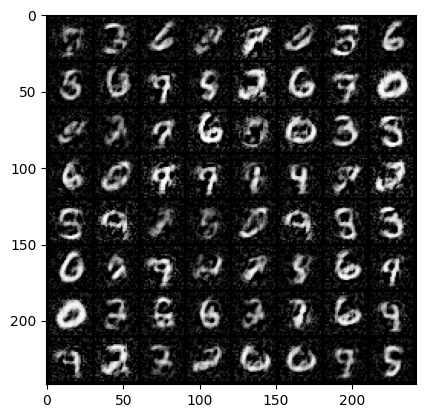

Epoch [36/80] Batch [0/1875]             Loss D: 0.2000, Loss G: 4.0868
Epoch [36/80] Batch [100/1875]             Loss D: 0.4003, Loss G: 3.5300
Epoch [36/80] Batch [200/1875]             Loss D: 0.4036, Loss G: 3.2243
Epoch [36/80] Batch [300/1875]             Loss D: 0.4785, Loss G: 4.0476
Epoch [36/80] Batch [400/1875]             Loss D: 0.2668, Loss G: 3.5534
Epoch [36/80] Batch [500/1875]             Loss D: 0.6270, Loss G: 3.2634
Epoch [36/80] Batch [600/1875]             Loss D: 0.4464, Loss G: 4.4417
Epoch [36/80] Batch [700/1875]             Loss D: 0.4997, Loss G: 3.8081
Epoch [36/80] Batch [800/1875]             Loss D: 0.3691, Loss G: 3.2619
Epoch [36/80] Batch [900/1875]             Loss D: 0.3021, Loss G: 3.1135
Epoch [36/80] Batch [1000/1875]             Loss D: 0.3020, Loss G: 3.2567
Epoch [36/80] Batch [1100/1875]             Loss D: 0.1745, Loss G: 4.3708
Epoch [36/80] Batch [1200/1875]             Loss D: 0.3916, Loss G: 3.2609
Epoch [36/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.83347416..0.99985635].


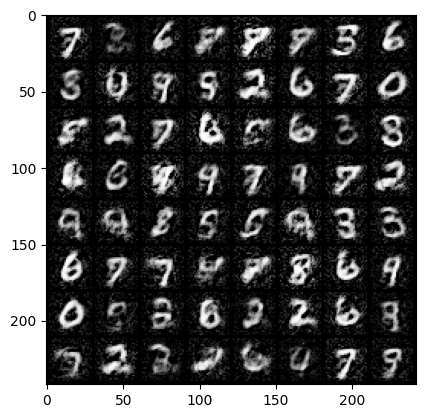

Epoch [37/80] Batch [0/1875]             Loss D: 0.4161, Loss G: 3.2528
Epoch [37/80] Batch [100/1875]             Loss D: 0.4762, Loss G: 3.4485
Epoch [37/80] Batch [200/1875]             Loss D: 0.6190, Loss G: 3.4452
Epoch [37/80] Batch [300/1875]             Loss D: 0.2650, Loss G: 3.7384
Epoch [37/80] Batch [400/1875]             Loss D: 0.5331, Loss G: 3.0256
Epoch [37/80] Batch [500/1875]             Loss D: 0.2505, Loss G: 4.2439
Epoch [37/80] Batch [600/1875]             Loss D: 0.4351, Loss G: 3.7226
Epoch [37/80] Batch [700/1875]             Loss D: 0.5707, Loss G: 3.2528
Epoch [37/80] Batch [800/1875]             Loss D: 0.4128, Loss G: 3.5212
Epoch [37/80] Batch [900/1875]             Loss D: 0.2248, Loss G: 3.1113
Epoch [37/80] Batch [1000/1875]             Loss D: 0.2779, Loss G: 3.8466
Epoch [37/80] Batch [1100/1875]             Loss D: 0.2680, Loss G: 4.0830
Epoch [37/80] Batch [1200/1875]             Loss D: 0.1517, Loss G: 3.3997
Epoch [37/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.96063083..0.9998407].


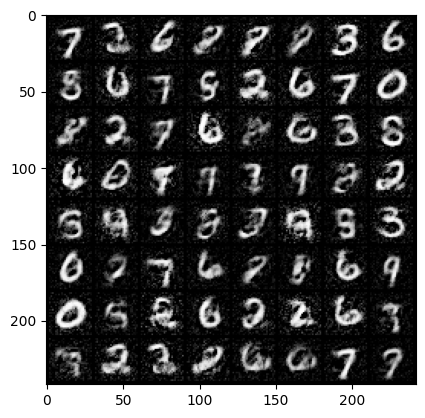

Epoch [38/80] Batch [0/1875]             Loss D: 0.2859, Loss G: 3.5247
Epoch [38/80] Batch [100/1875]             Loss D: 0.3174, Loss G: 2.8693
Epoch [38/80] Batch [200/1875]             Loss D: 0.2734, Loss G: 3.1806
Epoch [38/80] Batch [300/1875]             Loss D: 0.3023, Loss G: 3.5242
Epoch [38/80] Batch [400/1875]             Loss D: 0.4217, Loss G: 3.2630
Epoch [38/80] Batch [500/1875]             Loss D: 0.2565, Loss G: 4.0148
Epoch [38/80] Batch [600/1875]             Loss D: 0.5600, Loss G: 3.9177
Epoch [38/80] Batch [700/1875]             Loss D: 0.4908, Loss G: 3.1296
Epoch [38/80] Batch [800/1875]             Loss D: 0.2022, Loss G: 3.7085
Epoch [38/80] Batch [900/1875]             Loss D: 0.3871, Loss G: 3.5414
Epoch [38/80] Batch [1000/1875]             Loss D: 0.3873, Loss G: 3.8194
Epoch [38/80] Batch [1100/1875]             Loss D: 0.5837, Loss G: 3.1889
Epoch [38/80] Batch [1200/1875]             Loss D: 0.2810, Loss G: 3.5819
Epoch [38/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.83770293..0.9999571].


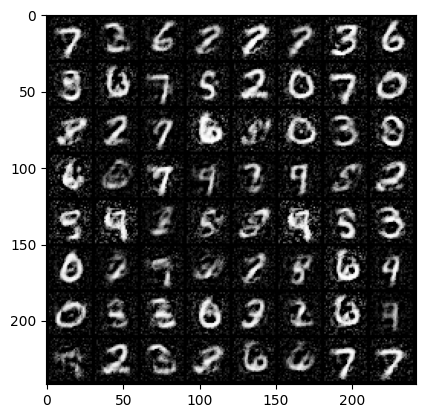

Epoch [39/80] Batch [0/1875]             Loss D: 0.2792, Loss G: 3.4111
Epoch [39/80] Batch [100/1875]             Loss D: 0.3252, Loss G: 3.4292
Epoch [39/80] Batch [200/1875]             Loss D: 0.4021, Loss G: 3.6750
Epoch [39/80] Batch [300/1875]             Loss D: 0.6393, Loss G: 3.3989
Epoch [39/80] Batch [400/1875]             Loss D: 0.3525, Loss G: 3.9252
Epoch [39/80] Batch [500/1875]             Loss D: 0.3996, Loss G: 3.2600
Epoch [39/80] Batch [600/1875]             Loss D: 0.3641, Loss G: 3.4673
Epoch [39/80] Batch [700/1875]             Loss D: 0.3751, Loss G: 4.3728
Epoch [39/80] Batch [800/1875]             Loss D: 0.3959, Loss G: 3.3956
Epoch [39/80] Batch [900/1875]             Loss D: 0.6720, Loss G: 3.3157
Epoch [39/80] Batch [1000/1875]             Loss D: 0.3000, Loss G: 3.7731
Epoch [39/80] Batch [1100/1875]             Loss D: 0.1791, Loss G: 4.1346
Epoch [39/80] Batch [1200/1875]             Loss D: 0.2254, Loss G: 3.7243
Epoch [39/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8708568..0.99998677].


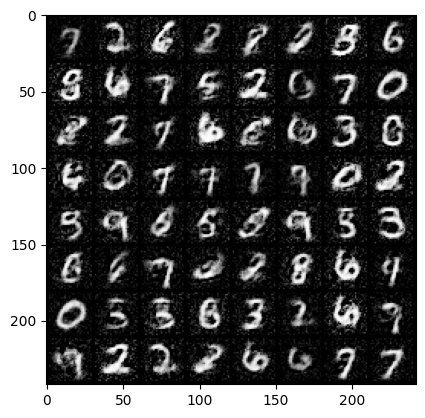

Epoch [40/80] Batch [0/1875]             Loss D: 0.3907, Loss G: 3.3578
Epoch [40/80] Batch [100/1875]             Loss D: 0.2757, Loss G: 4.2622
Epoch [40/80] Batch [200/1875]             Loss D: 0.5021, Loss G: 3.9098
Epoch [40/80] Batch [300/1875]             Loss D: 0.2604, Loss G: 3.5517
Epoch [40/80] Batch [400/1875]             Loss D: 0.4607, Loss G: 3.0438
Epoch [40/80] Batch [500/1875]             Loss D: 0.5602, Loss G: 2.7836
Epoch [40/80] Batch [600/1875]             Loss D: 0.3223, Loss G: 3.4266
Epoch [40/80] Batch [700/1875]             Loss D: 0.2755, Loss G: 3.7216
Epoch [40/80] Batch [800/1875]             Loss D: 0.2211, Loss G: 3.9020
Epoch [40/80] Batch [900/1875]             Loss D: 0.3371, Loss G: 3.9963
Epoch [40/80] Batch [1000/1875]             Loss D: 0.4252, Loss G: 3.8434
Epoch [40/80] Batch [1100/1875]             Loss D: 0.2622, Loss G: 4.7931
Epoch [40/80] Batch [1200/1875]             Loss D: 0.2555, Loss G: 3.4504
Epoch [40/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92697084..0.99984914].


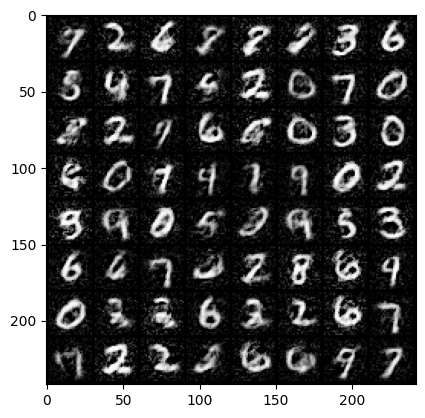

Epoch [41/80] Batch [0/1875]             Loss D: 0.3137, Loss G: 3.7607
Epoch [41/80] Batch [100/1875]             Loss D: 0.2064, Loss G: 3.6329
Epoch [41/80] Batch [200/1875]             Loss D: 0.5801, Loss G: 3.5557
Epoch [41/80] Batch [300/1875]             Loss D: 0.3356, Loss G: 3.3014
Epoch [41/80] Batch [400/1875]             Loss D: 0.3707, Loss G: 3.2852
Epoch [41/80] Batch [500/1875]             Loss D: 0.2665, Loss G: 3.9412
Epoch [41/80] Batch [600/1875]             Loss D: 0.3703, Loss G: 3.8232
Epoch [41/80] Batch [700/1875]             Loss D: 0.2171, Loss G: 4.0172
Epoch [41/80] Batch [800/1875]             Loss D: 0.3286, Loss G: 4.0253
Epoch [41/80] Batch [900/1875]             Loss D: 0.2572, Loss G: 3.7171
Epoch [41/80] Batch [1000/1875]             Loss D: 0.3481, Loss G: 3.4320
Epoch [41/80] Batch [1100/1875]             Loss D: 0.3405, Loss G: 3.5462
Epoch [41/80] Batch [1200/1875]             Loss D: 0.4042, Loss G: 3.5084
Epoch [41/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8724502..0.9998472].


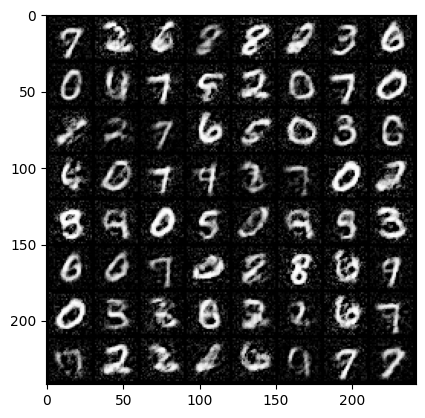

Epoch [42/80] Batch [0/1875]             Loss D: 0.2543, Loss G: 3.5388
Epoch [42/80] Batch [100/1875]             Loss D: 0.3524, Loss G: 3.3673
Epoch [42/80] Batch [200/1875]             Loss D: 0.3050, Loss G: 3.9553
Epoch [42/80] Batch [300/1875]             Loss D: 0.3008, Loss G: 3.8616
Epoch [42/80] Batch [400/1875]             Loss D: 0.2189, Loss G: 3.8034
Epoch [42/80] Batch [500/1875]             Loss D: 0.4362, Loss G: 3.8197
Epoch [42/80] Batch [600/1875]             Loss D: 0.5927, Loss G: 3.9464
Epoch [42/80] Batch [700/1875]             Loss D: 0.2088, Loss G: 3.5685
Epoch [42/80] Batch [800/1875]             Loss D: 0.2416, Loss G: 3.4458
Epoch [42/80] Batch [900/1875]             Loss D: 0.3913, Loss G: 4.1071
Epoch [42/80] Batch [1000/1875]             Loss D: 0.6441, Loss G: 3.8413
Epoch [42/80] Batch [1100/1875]             Loss D: 0.3000, Loss G: 2.8358
Epoch [42/80] Batch [1200/1875]             Loss D: 0.2782, Loss G: 3.8438
Epoch [42/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8129646..0.99976766].


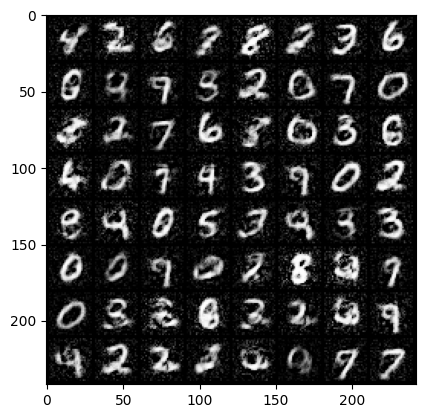

Epoch [43/80] Batch [0/1875]             Loss D: 0.3943, Loss G: 4.1820
Epoch [43/80] Batch [100/1875]             Loss D: 0.2103, Loss G: 3.6842
Epoch [43/80] Batch [200/1875]             Loss D: 0.4750, Loss G: 3.8075
Epoch [43/80] Batch [300/1875]             Loss D: 0.4488, Loss G: 3.1581
Epoch [43/80] Batch [400/1875]             Loss D: 0.2347, Loss G: 3.5935
Epoch [43/80] Batch [500/1875]             Loss D: 0.3178, Loss G: 4.3753
Epoch [43/80] Batch [600/1875]             Loss D: 0.1567, Loss G: 3.7781
Epoch [43/80] Batch [700/1875]             Loss D: 0.1802, Loss G: 3.9998
Epoch [43/80] Batch [800/1875]             Loss D: 0.2929, Loss G: 3.6767
Epoch [43/80] Batch [900/1875]             Loss D: 0.0603, Loss G: 4.8392
Epoch [43/80] Batch [1000/1875]             Loss D: 0.4313, Loss G: 4.3478
Epoch [43/80] Batch [1100/1875]             Loss D: 0.2717, Loss G: 3.5632
Epoch [43/80] Batch [1200/1875]             Loss D: 0.2909, Loss G: 3.8751
Epoch [43/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8651365..0.9999006].


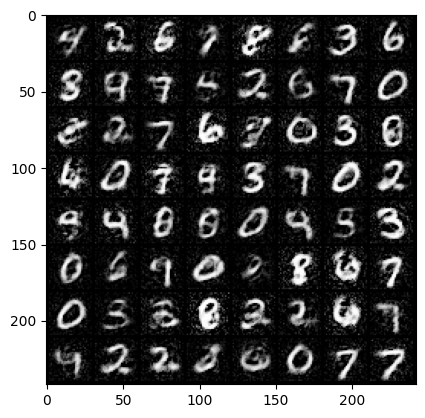

Epoch [44/80] Batch [0/1875]             Loss D: 0.3276, Loss G: 3.0281
Epoch [44/80] Batch [100/1875]             Loss D: 0.3562, Loss G: 3.5396
Epoch [44/80] Batch [200/1875]             Loss D: 0.5149, Loss G: 3.9885
Epoch [44/80] Batch [300/1875]             Loss D: 0.3447, Loss G: 3.8820
Epoch [44/80] Batch [400/1875]             Loss D: 0.3676, Loss G: 3.3710
Epoch [44/80] Batch [500/1875]             Loss D: 0.4676, Loss G: 2.2707
Epoch [44/80] Batch [600/1875]             Loss D: 0.3088, Loss G: 4.1135
Epoch [44/80] Batch [700/1875]             Loss D: 0.3254, Loss G: 3.6598
Epoch [44/80] Batch [800/1875]             Loss D: 0.2826, Loss G: 3.9278
Epoch [44/80] Batch [900/1875]             Loss D: 0.1477, Loss G: 3.7520
Epoch [44/80] Batch [1000/1875]             Loss D: 0.1863, Loss G: 4.1005
Epoch [44/80] Batch [1100/1875]             Loss D: 0.4237, Loss G: 3.3832
Epoch [44/80] Batch [1200/1875]             Loss D: 0.2860, Loss G: 3.4718
Epoch [44/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.88208556..0.9999972].


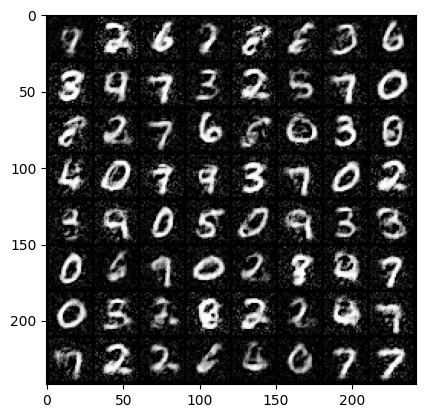

Epoch [45/80] Batch [0/1875]             Loss D: 0.3672, Loss G: 4.0909
Epoch [45/80] Batch [100/1875]             Loss D: 0.3889, Loss G: 3.4987
Epoch [45/80] Batch [200/1875]             Loss D: 0.4074, Loss G: 2.6048
Epoch [45/80] Batch [300/1875]             Loss D: 0.3736, Loss G: 4.0743
Epoch [45/80] Batch [400/1875]             Loss D: 0.3880, Loss G: 3.3851
Epoch [45/80] Batch [500/1875]             Loss D: 0.2855, Loss G: 3.6992
Epoch [45/80] Batch [600/1875]             Loss D: 0.2603, Loss G: 3.9674
Epoch [45/80] Batch [700/1875]             Loss D: 0.3618, Loss G: 3.9646
Epoch [45/80] Batch [800/1875]             Loss D: 0.3307, Loss G: 3.5408
Epoch [45/80] Batch [900/1875]             Loss D: 0.3393, Loss G: 3.5607
Epoch [45/80] Batch [1000/1875]             Loss D: 0.3890, Loss G: 4.4318
Epoch [45/80] Batch [1100/1875]             Loss D: 0.3064, Loss G: 3.9172
Epoch [45/80] Batch [1200/1875]             Loss D: 0.2918, Loss G: 3.6041
Epoch [45/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9002491..0.99995583].


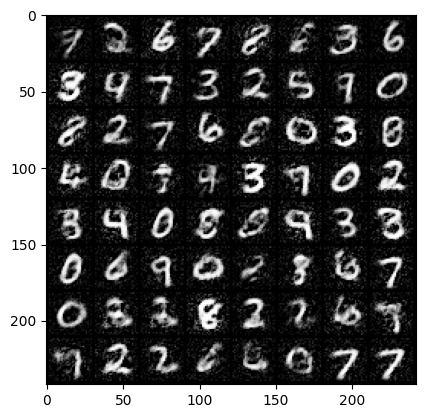

Epoch [46/80] Batch [0/1875]             Loss D: 0.3400, Loss G: 4.3694
Epoch [46/80] Batch [100/1875]             Loss D: 0.3980, Loss G: 2.9031
Epoch [46/80] Batch [200/1875]             Loss D: 0.2944, Loss G: 3.3219
Epoch [46/80] Batch [300/1875]             Loss D: 0.4133, Loss G: 3.5495
Epoch [46/80] Batch [400/1875]             Loss D: 0.3177, Loss G: 3.7935
Epoch [46/80] Batch [500/1875]             Loss D: 0.4819, Loss G: 2.9329
Epoch [46/80] Batch [600/1875]             Loss D: 0.4935, Loss G: 3.1292
Epoch [46/80] Batch [700/1875]             Loss D: 0.4091, Loss G: 4.0522
Epoch [46/80] Batch [800/1875]             Loss D: 0.3853, Loss G: 3.8724
Epoch [46/80] Batch [900/1875]             Loss D: 0.1970, Loss G: 3.4387
Epoch [46/80] Batch [1000/1875]             Loss D: 0.4344, Loss G: 3.7594
Epoch [46/80] Batch [1100/1875]             Loss D: 0.3592, Loss G: 4.0536
Epoch [46/80] Batch [1200/1875]             Loss D: 0.2032, Loss G: 4.0543
Epoch [46/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9559949..0.99951583].


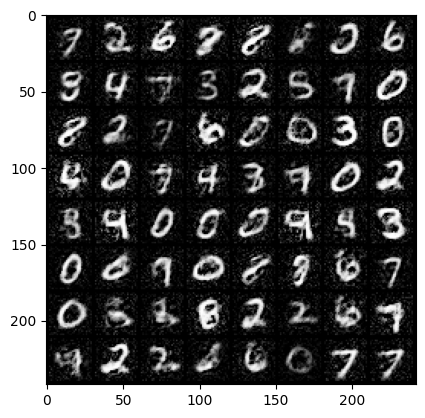

Epoch [47/80] Batch [0/1875]             Loss D: 0.5458, Loss G: 3.7573
Epoch [47/80] Batch [100/1875]             Loss D: 0.2990, Loss G: 3.7707
Epoch [47/80] Batch [200/1875]             Loss D: 0.3686, Loss G: 3.4106
Epoch [47/80] Batch [300/1875]             Loss D: 0.2057, Loss G: 3.7974
Epoch [47/80] Batch [400/1875]             Loss D: 0.4290, Loss G: 4.0431
Epoch [47/80] Batch [500/1875]             Loss D: 0.5552, Loss G: 3.5827
Epoch [47/80] Batch [600/1875]             Loss D: 0.3269, Loss G: 2.9717
Epoch [47/80] Batch [700/1875]             Loss D: 0.6178, Loss G: 3.5723
Epoch [47/80] Batch [800/1875]             Loss D: 0.2102, Loss G: 4.8658
Epoch [47/80] Batch [900/1875]             Loss D: 0.4613, Loss G: 3.5602
Epoch [47/80] Batch [1000/1875]             Loss D: 0.1946, Loss G: 3.8556
Epoch [47/80] Batch [1100/1875]             Loss D: 0.2106, Loss G: 3.7566
Epoch [47/80] Batch [1200/1875]             Loss D: 0.1250, Loss G: 3.7006
Epoch [47/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9266614..0.9997556].


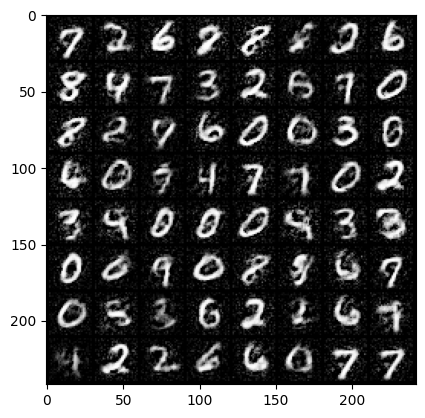

Epoch [48/80] Batch [0/1875]             Loss D: 0.4447, Loss G: 3.4380
Epoch [48/80] Batch [100/1875]             Loss D: 0.3366, Loss G: 3.6044
Epoch [48/80] Batch [200/1875]             Loss D: 0.8242, Loss G: 3.1615
Epoch [48/80] Batch [300/1875]             Loss D: 0.2373, Loss G: 3.5229
Epoch [48/80] Batch [400/1875]             Loss D: 0.3277, Loss G: 2.9972
Epoch [48/80] Batch [500/1875]             Loss D: 0.2504, Loss G: 4.2287
Epoch [48/80] Batch [600/1875]             Loss D: 0.4453, Loss G: 3.0048
Epoch [48/80] Batch [700/1875]             Loss D: 0.2545, Loss G: 3.7141
Epoch [48/80] Batch [800/1875]             Loss D: 0.2193, Loss G: 3.1782
Epoch [48/80] Batch [900/1875]             Loss D: 0.5365, Loss G: 2.9925
Epoch [48/80] Batch [1000/1875]             Loss D: 0.1316, Loss G: 4.3320
Epoch [48/80] Batch [1100/1875]             Loss D: 0.6960, Loss G: 3.8041
Epoch [48/80] Batch [1200/1875]             Loss D: 0.1875, Loss G: 4.1023
Epoch [48/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.80307484..0.99996054].


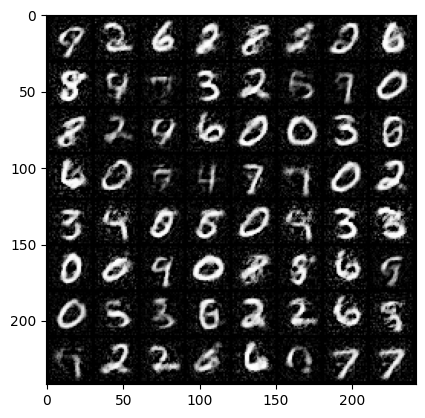

Epoch [49/80] Batch [0/1875]             Loss D: 0.1753, Loss G: 3.8236
Epoch [49/80] Batch [100/1875]             Loss D: 0.3481, Loss G: 3.7842
Epoch [49/80] Batch [200/1875]             Loss D: 0.5635, Loss G: 3.5075
Epoch [49/80] Batch [300/1875]             Loss D: 0.4578, Loss G: 4.0730
Epoch [49/80] Batch [400/1875]             Loss D: 0.4534, Loss G: 2.8558
Epoch [49/80] Batch [500/1875]             Loss D: 0.4458, Loss G: 3.1349
Epoch [49/80] Batch [600/1875]             Loss D: 0.2248, Loss G: 4.0749
Epoch [49/80] Batch [700/1875]             Loss D: 0.2463, Loss G: 3.6058
Epoch [49/80] Batch [800/1875]             Loss D: 0.2423, Loss G: 3.2626
Epoch [49/80] Batch [900/1875]             Loss D: 0.5861, Loss G: 3.1083
Epoch [49/80] Batch [1000/1875]             Loss D: 0.5529, Loss G: 3.6817
Epoch [49/80] Batch [1100/1875]             Loss D: 0.1947, Loss G: 3.7534
Epoch [49/80] Batch [1200/1875]             Loss D: 0.2663, Loss G: 3.9848
Epoch [49/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92201805..0.99997777].


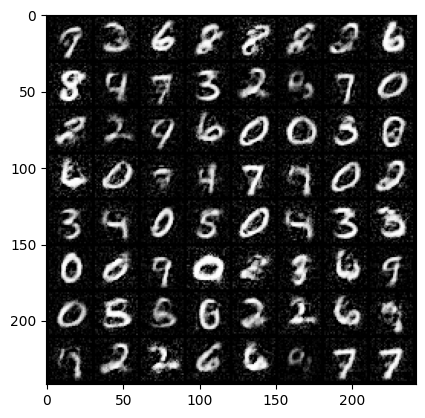

Epoch [50/80] Batch [0/1875]             Loss D: 0.4327, Loss G: 3.0260
Epoch [50/80] Batch [100/1875]             Loss D: 0.1036, Loss G: 4.2231
Epoch [50/80] Batch [200/1875]             Loss D: 0.2699, Loss G: 3.9296
Epoch [50/80] Batch [300/1875]             Loss D: 0.6078, Loss G: 3.0528
Epoch [50/80] Batch [400/1875]             Loss D: 0.3643, Loss G: 3.8759
Epoch [50/80] Batch [500/1875]             Loss D: 0.4665, Loss G: 3.6099
Epoch [50/80] Batch [600/1875]             Loss D: 0.5243, Loss G: 3.6520
Epoch [50/80] Batch [700/1875]             Loss D: 0.4139, Loss G: 3.2095
Epoch [50/80] Batch [800/1875]             Loss D: 0.4516, Loss G: 3.3129
Epoch [50/80] Batch [900/1875]             Loss D: 0.5154, Loss G: 4.0288
Epoch [50/80] Batch [1000/1875]             Loss D: 0.4069, Loss G: 3.3464
Epoch [50/80] Batch [1100/1875]             Loss D: 0.1777, Loss G: 3.5013
Epoch [50/80] Batch [1200/1875]             Loss D: 0.3222, Loss G: 4.0244
Epoch [50/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9263234..0.9999131].


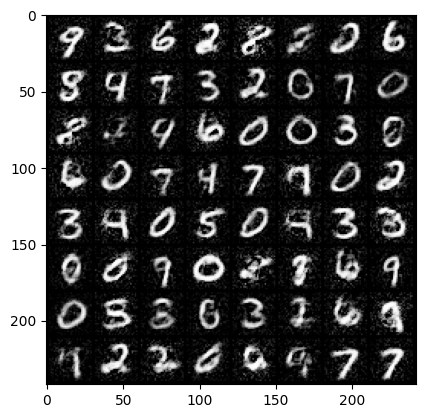

Epoch [51/80] Batch [0/1875]             Loss D: 0.4163, Loss G: 4.1816
Epoch [51/80] Batch [100/1875]             Loss D: 0.4420, Loss G: 4.2038
Epoch [51/80] Batch [200/1875]             Loss D: 0.2060, Loss G: 3.4860
Epoch [51/80] Batch [300/1875]             Loss D: 0.4562, Loss G: 2.7582
Epoch [51/80] Batch [400/1875]             Loss D: 0.4404, Loss G: 3.0636
Epoch [51/80] Batch [500/1875]             Loss D: 0.4473, Loss G: 4.0748
Epoch [51/80] Batch [600/1875]             Loss D: 0.2852, Loss G: 3.8797
Epoch [51/80] Batch [700/1875]             Loss D: 0.3685, Loss G: 3.4573
Epoch [51/80] Batch [800/1875]             Loss D: 0.1946, Loss G: 3.7454
Epoch [51/80] Batch [900/1875]             Loss D: 0.5576, Loss G: 3.4096
Epoch [51/80] Batch [1000/1875]             Loss D: 0.4358, Loss G: 4.0625
Epoch [51/80] Batch [1100/1875]             Loss D: 0.5994, Loss G: 3.2785
Epoch [51/80] Batch [1200/1875]             Loss D: 0.3652, Loss G: 3.4930
Epoch [51/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9144651..0.99982893].


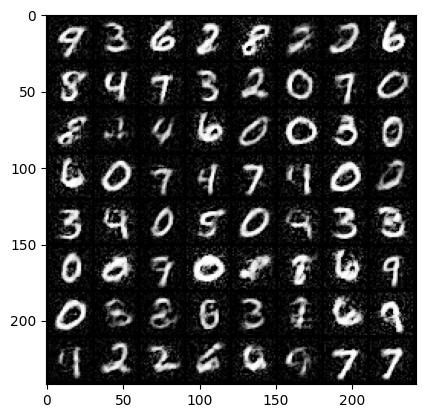

Epoch [52/80] Batch [0/1875]             Loss D: 0.3350, Loss G: 4.0734
Epoch [52/80] Batch [100/1875]             Loss D: 0.1971, Loss G: 3.9749
Epoch [52/80] Batch [200/1875]             Loss D: 0.4289, Loss G: 3.0306
Epoch [52/80] Batch [300/1875]             Loss D: 0.5021, Loss G: 3.4419
Epoch [52/80] Batch [400/1875]             Loss D: 0.1315, Loss G: 3.4162
Epoch [52/80] Batch [500/1875]             Loss D: 0.3908, Loss G: 3.3697
Epoch [52/80] Batch [600/1875]             Loss D: 0.2751, Loss G: 3.8214
Epoch [52/80] Batch [700/1875]             Loss D: 0.2039, Loss G: 3.5139
Epoch [52/80] Batch [800/1875]             Loss D: 0.4436, Loss G: 3.4718
Epoch [52/80] Batch [900/1875]             Loss D: 0.3536, Loss G: 3.9128
Epoch [52/80] Batch [1000/1875]             Loss D: 0.2618, Loss G: 3.2798
Epoch [52/80] Batch [1100/1875]             Loss D: 0.5662, Loss G: 3.5926
Epoch [52/80] Batch [1200/1875]             Loss D: 0.5689, Loss G: 3.4001
Epoch [52/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91007304..0.9999814].


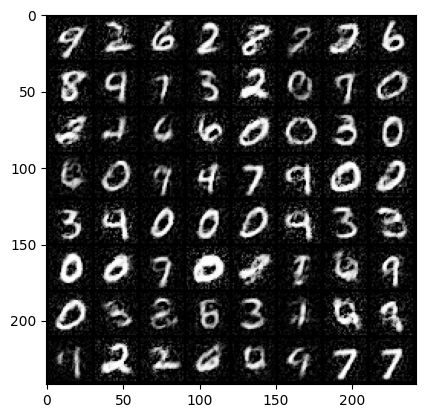

Epoch [53/80] Batch [0/1875]             Loss D: 0.2248, Loss G: 4.0343
Epoch [53/80] Batch [100/1875]             Loss D: 0.3645, Loss G: 3.5707
Epoch [53/80] Batch [200/1875]             Loss D: 0.2928, Loss G: 3.7783
Epoch [53/80] Batch [300/1875]             Loss D: 0.3728, Loss G: 3.2977
Epoch [53/80] Batch [400/1875]             Loss D: 0.4620, Loss G: 3.8451
Epoch [53/80] Batch [500/1875]             Loss D: 0.2610, Loss G: 3.5931
Epoch [53/80] Batch [600/1875]             Loss D: 0.3268, Loss G: 3.1602
Epoch [53/80] Batch [700/1875]             Loss D: 0.3447, Loss G: 3.2598
Epoch [53/80] Batch [800/1875]             Loss D: 0.4716, Loss G: 3.4072
Epoch [53/80] Batch [900/1875]             Loss D: 0.4041, Loss G: 3.9705
Epoch [53/80] Batch [1000/1875]             Loss D: 0.3314, Loss G: 3.3076
Epoch [53/80] Batch [1100/1875]             Loss D: 0.3599, Loss G: 3.9432
Epoch [53/80] Batch [1200/1875]             Loss D: 0.2723, Loss G: 4.0934
Epoch [53/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98106..0.9999863].


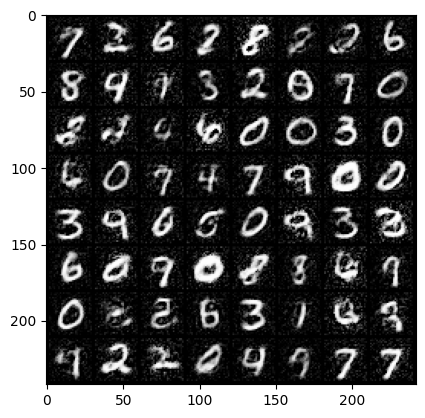

Epoch [54/80] Batch [0/1875]             Loss D: 0.3816, Loss G: 3.4575
Epoch [54/80] Batch [100/1875]             Loss D: 0.2360, Loss G: 3.3254
Epoch [54/80] Batch [200/1875]             Loss D: 0.3658, Loss G: 3.1784
Epoch [54/80] Batch [300/1875]             Loss D: 0.1395, Loss G: 3.8997
Epoch [54/80] Batch [400/1875]             Loss D: 0.5147, Loss G: 3.8504
Epoch [54/80] Batch [500/1875]             Loss D: 0.2182, Loss G: 3.8405
Epoch [54/80] Batch [600/1875]             Loss D: 0.2590, Loss G: 3.9074
Epoch [54/80] Batch [700/1875]             Loss D: 0.5692, Loss G: 3.9125
Epoch [54/80] Batch [800/1875]             Loss D: 0.3833, Loss G: 2.8486
Epoch [54/80] Batch [900/1875]             Loss D: 0.5698, Loss G: 3.2300
Epoch [54/80] Batch [1000/1875]             Loss D: 0.2825, Loss G: 3.5916
Epoch [54/80] Batch [1100/1875]             Loss D: 0.3432, Loss G: 3.9608
Epoch [54/80] Batch [1200/1875]             Loss D: 0.4277, Loss G: 3.5397
Epoch [54/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9560941..0.99999803].


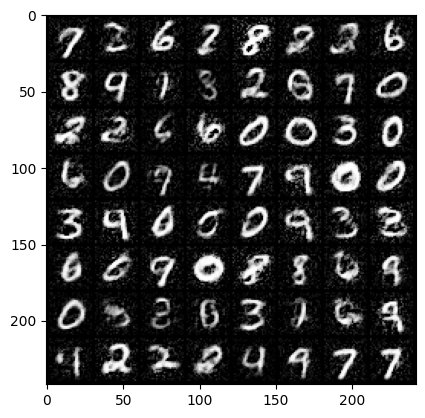

Epoch [55/80] Batch [0/1875]             Loss D: 0.2831, Loss G: 3.6501
Epoch [55/80] Batch [100/1875]             Loss D: 0.7599, Loss G: 3.4745
Epoch [55/80] Batch [200/1875]             Loss D: 0.2538, Loss G: 3.4262
Epoch [55/80] Batch [300/1875]             Loss D: 0.2273, Loss G: 3.4892
Epoch [55/80] Batch [400/1875]             Loss D: 0.1952, Loss G: 3.3361
Epoch [55/80] Batch [500/1875]             Loss D: 0.3614, Loss G: 3.5256
Epoch [55/80] Batch [600/1875]             Loss D: 0.3796, Loss G: 3.0253
Epoch [55/80] Batch [700/1875]             Loss D: 0.2730, Loss G: 3.0191
Epoch [55/80] Batch [800/1875]             Loss D: 0.3887, Loss G: 3.9001
Epoch [55/80] Batch [900/1875]             Loss D: 0.1635, Loss G: 3.7586
Epoch [55/80] Batch [1000/1875]             Loss D: 0.2984, Loss G: 3.3208
Epoch [55/80] Batch [1100/1875]             Loss D: 0.4204, Loss G: 3.9031
Epoch [55/80] Batch [1200/1875]             Loss D: 0.2165, Loss G: 3.5503
Epoch [55/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95681906..0.99999213].


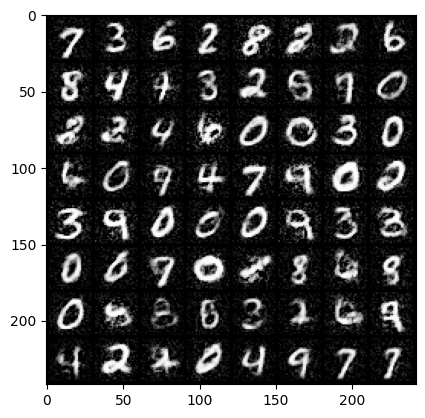

Epoch [56/80] Batch [0/1875]             Loss D: 0.3360, Loss G: 3.9167
Epoch [56/80] Batch [100/1875]             Loss D: 0.1885, Loss G: 3.3295
Epoch [56/80] Batch [200/1875]             Loss D: 0.3474, Loss G: 3.4022
Epoch [56/80] Batch [300/1875]             Loss D: 0.4090, Loss G: 3.1795
Epoch [56/80] Batch [400/1875]             Loss D: 0.2814, Loss G: 3.0168
Epoch [56/80] Batch [500/1875]             Loss D: 0.1734, Loss G: 3.5269
Epoch [56/80] Batch [600/1875]             Loss D: 0.3459, Loss G: 3.0863
Epoch [56/80] Batch [700/1875]             Loss D: 0.2781, Loss G: 3.8691
Epoch [56/80] Batch [800/1875]             Loss D: 0.3404, Loss G: 4.5715
Epoch [56/80] Batch [900/1875]             Loss D: 0.4799, Loss G: 3.4515
Epoch [56/80] Batch [1000/1875]             Loss D: 0.8111, Loss G: 3.2962
Epoch [56/80] Batch [1100/1875]             Loss D: 0.6534, Loss G: 3.3680
Epoch [56/80] Batch [1200/1875]             Loss D: 0.3795, Loss G: 2.9104
Epoch [56/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9824847..0.9999996].


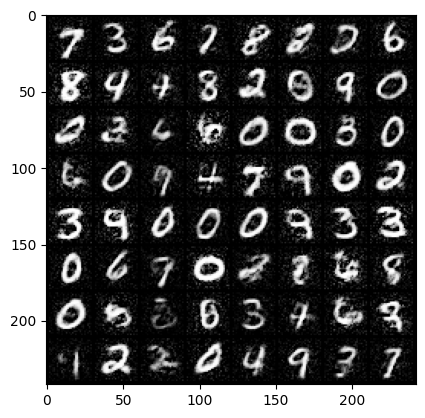

Epoch [57/80] Batch [0/1875]             Loss D: 0.4207, Loss G: 4.0482
Epoch [57/80] Batch [100/1875]             Loss D: 0.1921, Loss G: 3.5528
Epoch [57/80] Batch [200/1875]             Loss D: 0.2357, Loss G: 3.5173
Epoch [57/80] Batch [300/1875]             Loss D: 0.3544, Loss G: 4.1008
Epoch [57/80] Batch [400/1875]             Loss D: 0.3276, Loss G: 3.9972
Epoch [57/80] Batch [500/1875]             Loss D: 0.4308, Loss G: 3.5734
Epoch [57/80] Batch [600/1875]             Loss D: 0.4039, Loss G: 3.6404
Epoch [57/80] Batch [700/1875]             Loss D: 0.3953, Loss G: 3.4909
Epoch [57/80] Batch [800/1875]             Loss D: 0.4866, Loss G: 2.7353
Epoch [57/80] Batch [900/1875]             Loss D: 0.4702, Loss G: 3.6916
Epoch [57/80] Batch [1000/1875]             Loss D: 0.2167, Loss G: 3.5801
Epoch [57/80] Batch [1100/1875]             Loss D: 0.2710, Loss G: 3.6011
Epoch [57/80] Batch [1200/1875]             Loss D: 0.6011, Loss G: 4.1041
Epoch [57/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95404875..0.9999998].


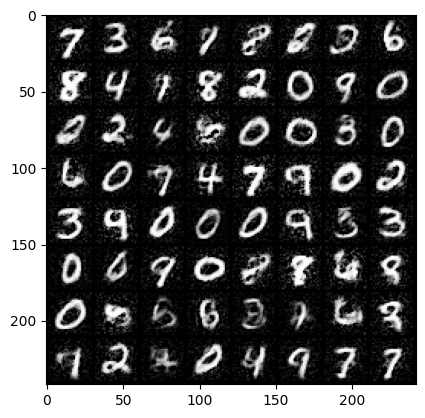

Epoch [58/80] Batch [0/1875]             Loss D: 0.4523, Loss G: 3.6344
Epoch [58/80] Batch [100/1875]             Loss D: 0.3906, Loss G: 3.3481
Epoch [58/80] Batch [200/1875]             Loss D: 0.4194, Loss G: 3.6310
Epoch [58/80] Batch [300/1875]             Loss D: 0.3104, Loss G: 3.3992
Epoch [58/80] Batch [400/1875]             Loss D: 0.2295, Loss G: 3.2043
Epoch [58/80] Batch [500/1875]             Loss D: 0.3288, Loss G: 3.8209
Epoch [58/80] Batch [600/1875]             Loss D: 0.4796, Loss G: 3.0332
Epoch [58/80] Batch [700/1875]             Loss D: 0.2668, Loss G: 3.1204
Epoch [58/80] Batch [800/1875]             Loss D: 0.2984, Loss G: 3.1210
Epoch [58/80] Batch [900/1875]             Loss D: 0.2265, Loss G: 3.4049
Epoch [58/80] Batch [1000/1875]             Loss D: 0.4171, Loss G: 3.6585
Epoch [58/80] Batch [1100/1875]             Loss D: 0.2394, Loss G: 4.0785
Epoch [58/80] Batch [1200/1875]             Loss D: 0.3774, Loss G: 3.6343
Epoch [58/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.88756835..0.9999963].


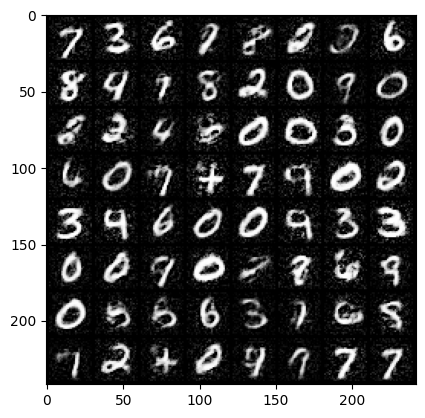

Epoch [59/80] Batch [0/1875]             Loss D: 0.7152, Loss G: 3.5269
Epoch [59/80] Batch [100/1875]             Loss D: 0.4886, Loss G: 3.3058
Epoch [59/80] Batch [200/1875]             Loss D: 0.8457, Loss G: 2.9976
Epoch [59/80] Batch [300/1875]             Loss D: 0.3654, Loss G: 3.0624
Epoch [59/80] Batch [400/1875]             Loss D: 0.4006, Loss G: 2.8783
Epoch [59/80] Batch [500/1875]             Loss D: 0.4623, Loss G: 3.2040
Epoch [59/80] Batch [600/1875]             Loss D: 0.6561, Loss G: 3.4757
Epoch [59/80] Batch [700/1875]             Loss D: 0.2041, Loss G: 3.4808
Epoch [59/80] Batch [800/1875]             Loss D: 0.4261, Loss G: 3.7216
Epoch [59/80] Batch [900/1875]             Loss D: 0.2861, Loss G: 4.1224
Epoch [59/80] Batch [1000/1875]             Loss D: 0.3172, Loss G: 4.2660
Epoch [59/80] Batch [1100/1875]             Loss D: 0.7170, Loss G: 2.5871
Epoch [59/80] Batch [1200/1875]             Loss D: 0.2665, Loss G: 4.1624
Epoch [59/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94286007..0.99999994].


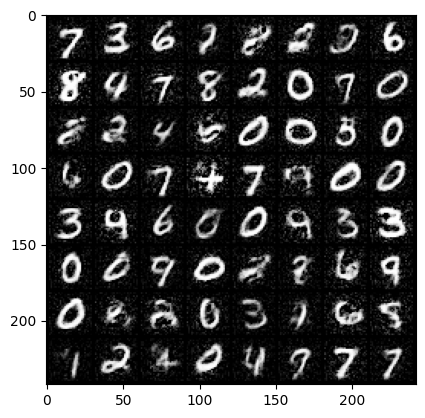

Epoch [60/80] Batch [0/1875]             Loss D: 0.3117, Loss G: 3.3273
Epoch [60/80] Batch [100/1875]             Loss D: 0.2769, Loss G: 3.3514
Epoch [60/80] Batch [200/1875]             Loss D: 0.2018, Loss G: 3.9900
Epoch [60/80] Batch [300/1875]             Loss D: 0.4091, Loss G: 3.9182
Epoch [60/80] Batch [400/1875]             Loss D: 0.4053, Loss G: 3.3696
Epoch [60/80] Batch [500/1875]             Loss D: 0.4185, Loss G: 3.1764
Epoch [60/80] Batch [600/1875]             Loss D: 0.4324, Loss G: 3.5025
Epoch [60/80] Batch [700/1875]             Loss D: 0.2605, Loss G: 2.6167
Epoch [60/80] Batch [800/1875]             Loss D: 0.2050, Loss G: 4.0381
Epoch [60/80] Batch [900/1875]             Loss D: 0.5667, Loss G: 2.9917
Epoch [60/80] Batch [1000/1875]             Loss D: 0.2589, Loss G: 3.6801
Epoch [60/80] Batch [1100/1875]             Loss D: 0.3159, Loss G: 3.3916
Epoch [60/80] Batch [1200/1875]             Loss D: 0.3507, Loss G: 3.6264
Epoch [60/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7843954..0.99999976].


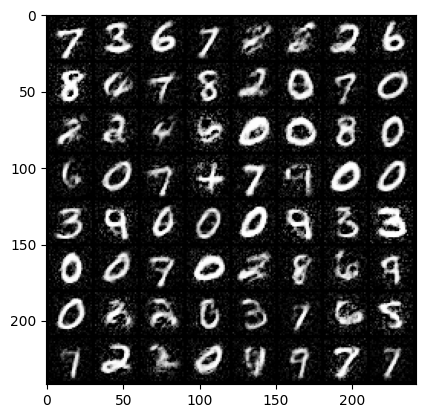

Epoch [61/80] Batch [0/1875]             Loss D: 0.1520, Loss G: 3.4715
Epoch [61/80] Batch [100/1875]             Loss D: 0.2991, Loss G: 3.8468
Epoch [61/80] Batch [200/1875]             Loss D: 0.4102, Loss G: 3.6606
Epoch [61/80] Batch [300/1875]             Loss D: 0.1616, Loss G: 3.4774
Epoch [61/80] Batch [400/1875]             Loss D: 0.6896, Loss G: 3.0479
Epoch [61/80] Batch [500/1875]             Loss D: 0.2395, Loss G: 3.8646
Epoch [61/80] Batch [600/1875]             Loss D: 0.5084, Loss G: 3.0922
Epoch [61/80] Batch [700/1875]             Loss D: 0.3405, Loss G: 3.1566
Epoch [61/80] Batch [800/1875]             Loss D: 0.2047, Loss G: 3.3970
Epoch [61/80] Batch [900/1875]             Loss D: 0.4416, Loss G: 3.8426
Epoch [61/80] Batch [1000/1875]             Loss D: 0.2309, Loss G: 3.7270
Epoch [61/80] Batch [1100/1875]             Loss D: 0.4233, Loss G: 3.2216
Epoch [61/80] Batch [1200/1875]             Loss D: 0.3244, Loss G: 3.8024
Epoch [61/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8384269..1.0].


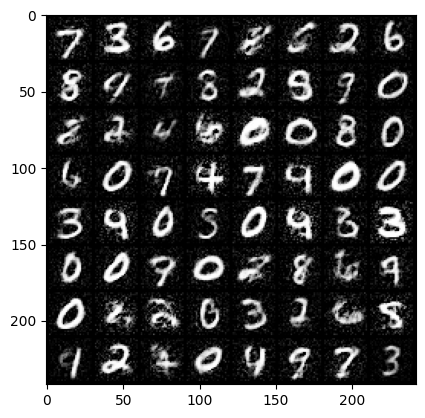

Epoch [62/80] Batch [0/1875]             Loss D: 0.2946, Loss G: 3.3150
Epoch [62/80] Batch [100/1875]             Loss D: 0.3541, Loss G: 3.1817
Epoch [62/80] Batch [200/1875]             Loss D: 0.3381, Loss G: 3.9549
Epoch [62/80] Batch [300/1875]             Loss D: 0.4743, Loss G: 4.0791
Epoch [62/80] Batch [400/1875]             Loss D: 0.3655, Loss G: 3.5285
Epoch [62/80] Batch [500/1875]             Loss D: 0.4177, Loss G: 3.7377
Epoch [62/80] Batch [600/1875]             Loss D: 0.3423, Loss G: 3.0594
Epoch [62/80] Batch [700/1875]             Loss D: 0.3377, Loss G: 2.8790
Epoch [62/80] Batch [800/1875]             Loss D: 0.7015, Loss G: 2.9309
Epoch [62/80] Batch [900/1875]             Loss D: 0.4210, Loss G: 3.5118
Epoch [62/80] Batch [1000/1875]             Loss D: 0.2729, Loss G: 3.1684
Epoch [62/80] Batch [1100/1875]             Loss D: 0.3522, Loss G: 2.9051
Epoch [62/80] Batch [1200/1875]             Loss D: 0.4908, Loss G: 3.2356
Epoch [62/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9595095..1.0].


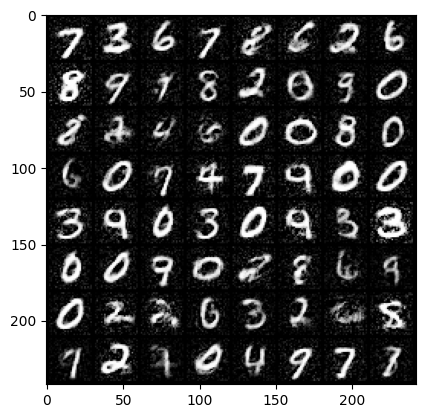

Epoch [63/80] Batch [0/1875]             Loss D: 0.7483, Loss G: 2.5372
Epoch [63/80] Batch [100/1875]             Loss D: 0.4355, Loss G: 3.5370
Epoch [63/80] Batch [200/1875]             Loss D: 0.3566, Loss G: 2.6453
Epoch [63/80] Batch [300/1875]             Loss D: 0.5663, Loss G: 2.6049
Epoch [63/80] Batch [400/1875]             Loss D: 0.5206, Loss G: 3.0860
Epoch [63/80] Batch [500/1875]             Loss D: 0.3711, Loss G: 3.8964
Epoch [63/80] Batch [600/1875]             Loss D: 0.4071, Loss G: 3.3649
Epoch [63/80] Batch [700/1875]             Loss D: 0.4754, Loss G: 3.8134
Epoch [63/80] Batch [800/1875]             Loss D: 0.3635, Loss G: 3.1756
Epoch [63/80] Batch [900/1875]             Loss D: 0.2641, Loss G: 3.1573
Epoch [63/80] Batch [1000/1875]             Loss D: 0.3344, Loss G: 3.6877
Epoch [63/80] Batch [1100/1875]             Loss D: 0.3680, Loss G: 3.0988
Epoch [63/80] Batch [1200/1875]             Loss D: 0.4782, Loss G: 2.9909
Epoch [63/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8907361..1.0].


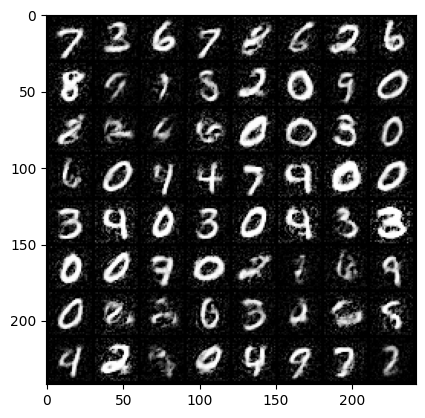

Epoch [64/80] Batch [0/1875]             Loss D: 0.1422, Loss G: 3.6409
Epoch [64/80] Batch [100/1875]             Loss D: 0.6011, Loss G: 3.7781
Epoch [64/80] Batch [200/1875]             Loss D: 0.3310, Loss G: 3.6403
Epoch [64/80] Batch [300/1875]             Loss D: 0.2616, Loss G: 3.8978
Epoch [64/80] Batch [400/1875]             Loss D: 0.3503, Loss G: 3.3462
Epoch [64/80] Batch [500/1875]             Loss D: 0.3643, Loss G: 3.7867
Epoch [64/80] Batch [600/1875]             Loss D: 0.6177, Loss G: 2.7137
Epoch [64/80] Batch [700/1875]             Loss D: 0.2269, Loss G: 3.4191
Epoch [64/80] Batch [800/1875]             Loss D: 0.3244, Loss G: 3.0440
Epoch [64/80] Batch [900/1875]             Loss D: 0.4180, Loss G: 3.9887
Epoch [64/80] Batch [1000/1875]             Loss D: 0.2322, Loss G: 2.7782
Epoch [64/80] Batch [1100/1875]             Loss D: 0.2970, Loss G: 3.4064
Epoch [64/80] Batch [1200/1875]             Loss D: 0.2749, Loss G: 3.6817
Epoch [64/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.89815605..1.0].


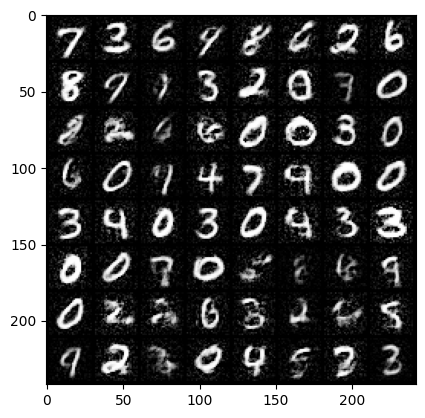

Epoch [65/80] Batch [0/1875]             Loss D: 0.4765, Loss G: 3.1756
Epoch [65/80] Batch [100/1875]             Loss D: 0.3257, Loss G: 3.0493
Epoch [65/80] Batch [200/1875]             Loss D: 0.3786, Loss G: 3.1090
Epoch [65/80] Batch [300/1875]             Loss D: 0.3994, Loss G: 4.2406
Epoch [65/80] Batch [400/1875]             Loss D: 0.3076, Loss G: 2.9581
Epoch [65/80] Batch [500/1875]             Loss D: 0.3372, Loss G: 2.9556
Epoch [65/80] Batch [600/1875]             Loss D: 0.2516, Loss G: 3.3913
Epoch [65/80] Batch [700/1875]             Loss D: 0.4595, Loss G: 3.0442
Epoch [65/80] Batch [800/1875]             Loss D: 0.1463, Loss G: 4.1357
Epoch [65/80] Batch [900/1875]             Loss D: 0.2968, Loss G: 2.6343
Epoch [65/80] Batch [1000/1875]             Loss D: 0.3614, Loss G: 3.1031
Epoch [65/80] Batch [1100/1875]             Loss D: 0.3890, Loss G: 3.2749
Epoch [65/80] Batch [1200/1875]             Loss D: 0.5926, Loss G: 3.0845
Epoch [65/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9811159..1.0].


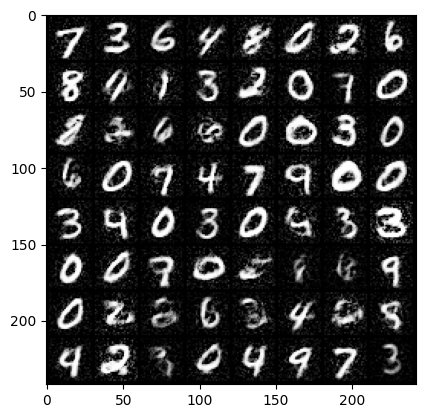

Epoch [66/80] Batch [0/1875]             Loss D: 0.2487, Loss G: 3.4032
Epoch [66/80] Batch [100/1875]             Loss D: 0.2487, Loss G: 3.2789
Epoch [66/80] Batch [200/1875]             Loss D: 0.7470, Loss G: 2.7579
Epoch [66/80] Batch [300/1875]             Loss D: 0.3585, Loss G: 3.1524
Epoch [66/80] Batch [400/1875]             Loss D: 0.7087, Loss G: 2.6333
Epoch [66/80] Batch [500/1875]             Loss D: 0.3838, Loss G: 3.3969
Epoch [66/80] Batch [600/1875]             Loss D: 0.4119, Loss G: 2.7458
Epoch [66/80] Batch [700/1875]             Loss D: 0.2771, Loss G: 2.8539
Epoch [66/80] Batch [800/1875]             Loss D: 0.3500, Loss G: 3.3573
Epoch [66/80] Batch [900/1875]             Loss D: 0.3132, Loss G: 3.7871
Epoch [66/80] Batch [1000/1875]             Loss D: 0.3431, Loss G: 2.8135
Epoch [66/80] Batch [1100/1875]             Loss D: 0.3791, Loss G: 3.1848
Epoch [66/80] Batch [1200/1875]             Loss D: 0.5046, Loss G: 2.7811
Epoch [66/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98252517..1.0].


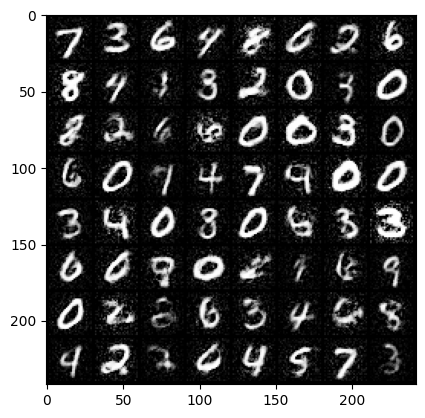

Epoch [67/80] Batch [0/1875]             Loss D: 0.4090, Loss G: 3.5382
Epoch [67/80] Batch [100/1875]             Loss D: 0.4985, Loss G: 3.6314
Epoch [67/80] Batch [200/1875]             Loss D: 0.2773, Loss G: 3.2096
Epoch [67/80] Batch [300/1875]             Loss D: 0.3930, Loss G: 3.3073
Epoch [67/80] Batch [400/1875]             Loss D: 0.3970, Loss G: 3.1474
Epoch [67/80] Batch [500/1875]             Loss D: 0.3042, Loss G: 3.5411
Epoch [67/80] Batch [600/1875]             Loss D: 0.2278, Loss G: 2.8983
Epoch [67/80] Batch [700/1875]             Loss D: 0.3309, Loss G: 3.4490
Epoch [67/80] Batch [800/1875]             Loss D: 0.3776, Loss G: 2.8970
Epoch [67/80] Batch [900/1875]             Loss D: 0.5096, Loss G: 3.1804
Epoch [67/80] Batch [1000/1875]             Loss D: 0.4531, Loss G: 3.7448
Epoch [67/80] Batch [1100/1875]             Loss D: 0.7112, Loss G: 2.4952
Epoch [67/80] Batch [1200/1875]             Loss D: 0.2386, Loss G: 3.5474
Epoch [67/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8891594..1.0].


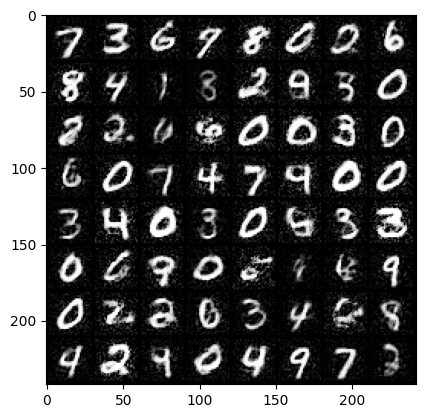

Epoch [68/80] Batch [0/1875]             Loss D: 0.5780, Loss G: 2.6410
Epoch [68/80] Batch [100/1875]             Loss D: 0.2684, Loss G: 2.8204
Epoch [68/80] Batch [200/1875]             Loss D: 0.2209, Loss G: 4.1413
Epoch [68/80] Batch [300/1875]             Loss D: 0.3834, Loss G: 3.2379
Epoch [68/80] Batch [400/1875]             Loss D: 0.3089, Loss G: 3.1958
Epoch [68/80] Batch [500/1875]             Loss D: 0.4055, Loss G: 2.9182
Epoch [68/80] Batch [600/1875]             Loss D: 0.2073, Loss G: 3.8906
Epoch [68/80] Batch [700/1875]             Loss D: 0.2850, Loss G: 3.3487
Epoch [68/80] Batch [800/1875]             Loss D: 0.3478, Loss G: 4.2870
Epoch [68/80] Batch [900/1875]             Loss D: 0.4609, Loss G: 3.7643
Epoch [68/80] Batch [1000/1875]             Loss D: 0.3184, Loss G: 2.9265
Epoch [68/80] Batch [1100/1875]             Loss D: 0.6393, Loss G: 3.5618
Epoch [68/80] Batch [1200/1875]             Loss D: 0.5801, Loss G: 2.9320
Epoch [68/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.81851685..1.0].


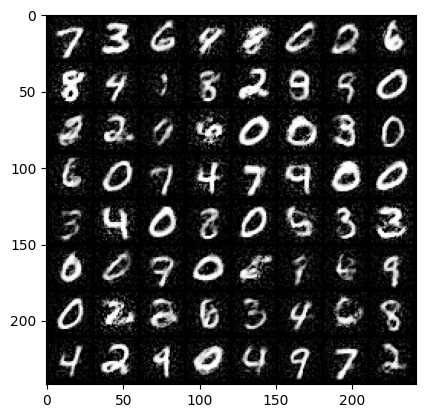

Epoch [69/80] Batch [0/1875]             Loss D: 0.4517, Loss G: 3.2240
Epoch [69/80] Batch [100/1875]             Loss D: 0.4204, Loss G: 3.7434
Epoch [69/80] Batch [200/1875]             Loss D: 0.4543, Loss G: 2.5658
Epoch [69/80] Batch [300/1875]             Loss D: 0.5745, Loss G: 2.6022
Epoch [69/80] Batch [400/1875]             Loss D: 0.2996, Loss G: 2.9080
Epoch [69/80] Batch [500/1875]             Loss D: 0.6351, Loss G: 2.6103
Epoch [69/80] Batch [600/1875]             Loss D: 0.3774, Loss G: 3.8153
Epoch [69/80] Batch [700/1875]             Loss D: 0.3501, Loss G: 3.1038
Epoch [69/80] Batch [800/1875]             Loss D: 0.3611, Loss G: 3.3985
Epoch [69/80] Batch [900/1875]             Loss D: 0.4948, Loss G: 2.7374
Epoch [69/80] Batch [1000/1875]             Loss D: 0.2677, Loss G: 4.1453
Epoch [69/80] Batch [1100/1875]             Loss D: 0.3224, Loss G: 3.1027
Epoch [69/80] Batch [1200/1875]             Loss D: 0.3234, Loss G: 2.9156
Epoch [69/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8746266..0.99999976].


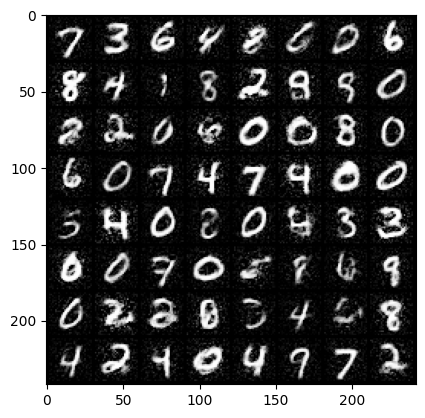

Epoch [70/80] Batch [0/1875]             Loss D: 0.5912, Loss G: 3.1336
Epoch [70/80] Batch [100/1875]             Loss D: 0.5832, Loss G: 2.6428
Epoch [70/80] Batch [200/1875]             Loss D: 0.5529, Loss G: 2.5038
Epoch [70/80] Batch [300/1875]             Loss D: 0.4100, Loss G: 3.4635
Epoch [70/80] Batch [400/1875]             Loss D: 0.4662, Loss G: 3.9023
Epoch [70/80] Batch [500/1875]             Loss D: 0.2685, Loss G: 3.8072
Epoch [70/80] Batch [600/1875]             Loss D: 0.4129, Loss G: 3.8153
Epoch [70/80] Batch [700/1875]             Loss D: 0.4710, Loss G: 3.3254
Epoch [70/80] Batch [800/1875]             Loss D: 0.5557, Loss G: 3.6269
Epoch [70/80] Batch [900/1875]             Loss D: 0.6972, Loss G: 3.0982
Epoch [70/80] Batch [1000/1875]             Loss D: 0.4884, Loss G: 3.1688
Epoch [70/80] Batch [1100/1875]             Loss D: 0.3581, Loss G: 3.0395
Epoch [70/80] Batch [1200/1875]             Loss D: 0.5604, Loss G: 3.5148
Epoch [70/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9161881..0.9999999].


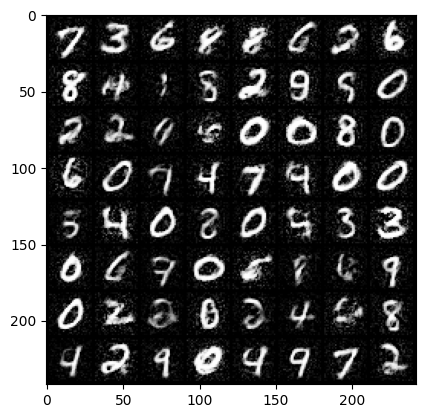

Epoch [71/80] Batch [0/1875]             Loss D: 0.4135, Loss G: 2.6056
Epoch [71/80] Batch [100/1875]             Loss D: 0.3320, Loss G: 3.2656
Epoch [71/80] Batch [200/1875]             Loss D: 0.5404, Loss G: 3.3846
Epoch [71/80] Batch [300/1875]             Loss D: 0.5479, Loss G: 3.2695
Epoch [71/80] Batch [400/1875]             Loss D: 0.3353, Loss G: 3.1271
Epoch [71/80] Batch [500/1875]             Loss D: 0.5991, Loss G: 3.1864
Epoch [71/80] Batch [600/1875]             Loss D: 0.4904, Loss G: 2.8310
Epoch [71/80] Batch [700/1875]             Loss D: 0.6638, Loss G: 3.8018
Epoch [71/80] Batch [800/1875]             Loss D: 0.6336, Loss G: 3.5788
Epoch [71/80] Batch [900/1875]             Loss D: 0.6129, Loss G: 3.2350
Epoch [71/80] Batch [1000/1875]             Loss D: 0.5603, Loss G: 2.5073
Epoch [71/80] Batch [1100/1875]             Loss D: 0.4881, Loss G: 3.6978
Epoch [71/80] Batch [1200/1875]             Loss D: 0.2538, Loss G: 2.9883
Epoch [71/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7704676..0.9999998].


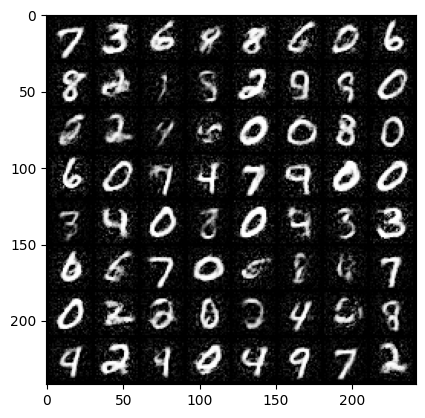

Epoch [72/80] Batch [0/1875]             Loss D: 0.4322, Loss G: 3.5322
Epoch [72/80] Batch [100/1875]             Loss D: 0.3068, Loss G: 3.0172
Epoch [72/80] Batch [200/1875]             Loss D: 0.3824, Loss G: 3.1994
Epoch [72/80] Batch [300/1875]             Loss D: 0.9958, Loss G: 3.0077
Epoch [72/80] Batch [400/1875]             Loss D: 0.3390, Loss G: 3.8072
Epoch [72/80] Batch [500/1875]             Loss D: 0.3254, Loss G: 3.6359
Epoch [72/80] Batch [600/1875]             Loss D: 0.3612, Loss G: 2.7534
Epoch [72/80] Batch [700/1875]             Loss D: 0.4766, Loss G: 3.0418
Epoch [72/80] Batch [800/1875]             Loss D: 0.6892, Loss G: 2.6192
Epoch [72/80] Batch [900/1875]             Loss D: 0.3659, Loss G: 3.4806
Epoch [72/80] Batch [1000/1875]             Loss D: 0.2675, Loss G: 3.5241
Epoch [72/80] Batch [1100/1875]             Loss D: 0.3366, Loss G: 2.7702
Epoch [72/80] Batch [1200/1875]             Loss D: 0.2889, Loss G: 3.3715
Epoch [72/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.88316596..0.9999998].


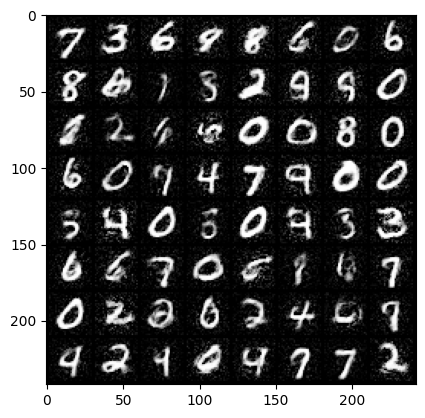

Epoch [73/80] Batch [0/1875]             Loss D: 0.5965, Loss G: 3.3495
Epoch [73/80] Batch [100/1875]             Loss D: 0.2976, Loss G: 2.8038
Epoch [73/80] Batch [200/1875]             Loss D: 0.6116, Loss G: 2.9070
Epoch [73/80] Batch [300/1875]             Loss D: 0.2290, Loss G: 3.1977
Epoch [73/80] Batch [400/1875]             Loss D: 0.3765, Loss G: 2.7257
Epoch [73/80] Batch [500/1875]             Loss D: 0.4879, Loss G: 3.3538
Epoch [73/80] Batch [600/1875]             Loss D: 0.5739, Loss G: 2.8498
Epoch [73/80] Batch [700/1875]             Loss D: 0.5941, Loss G: 3.1202
Epoch [73/80] Batch [800/1875]             Loss D: 0.3388, Loss G: 2.7410
Epoch [73/80] Batch [900/1875]             Loss D: 0.5126, Loss G: 3.9198
Epoch [73/80] Batch [1000/1875]             Loss D: 0.3338, Loss G: 3.3642
Epoch [73/80] Batch [1100/1875]             Loss D: 0.5058, Loss G: 3.0134
Epoch [73/80] Batch [1200/1875]             Loss D: 0.2951, Loss G: 3.2369
Epoch [73/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8287091..0.99999964].


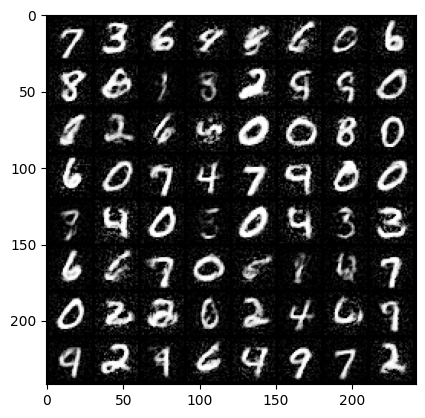

Epoch [74/80] Batch [0/1875]             Loss D: 0.3703, Loss G: 3.5694
Epoch [74/80] Batch [100/1875]             Loss D: 0.4084, Loss G: 3.4258
Epoch [74/80] Batch [200/1875]             Loss D: 0.6642, Loss G: 2.6418
Epoch [74/80] Batch [300/1875]             Loss D: 0.7699, Loss G: 2.6963
Epoch [74/80] Batch [400/1875]             Loss D: 0.3245, Loss G: 3.1676
Epoch [74/80] Batch [500/1875]             Loss D: 0.2253, Loss G: 4.2488
Epoch [74/80] Batch [600/1875]             Loss D: 0.3020, Loss G: 3.6046
Epoch [74/80] Batch [700/1875]             Loss D: 0.2535, Loss G: 2.8397
Epoch [74/80] Batch [800/1875]             Loss D: 0.2384, Loss G: 3.1866
Epoch [74/80] Batch [900/1875]             Loss D: 0.3827, Loss G: 3.3895
Epoch [74/80] Batch [1000/1875]             Loss D: 0.6293, Loss G: 2.6577
Epoch [74/80] Batch [1100/1875]             Loss D: 0.4800, Loss G: 3.3371
Epoch [74/80] Batch [1200/1875]             Loss D: 0.5559, Loss G: 3.6747
Epoch [74/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.89567006..1.0].


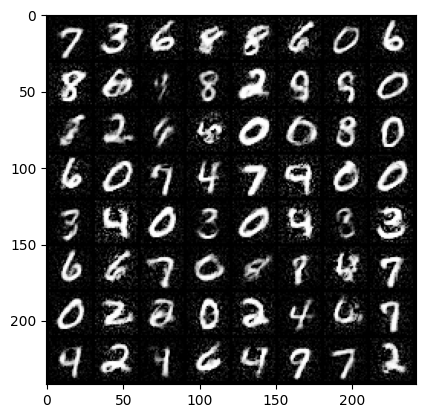

Epoch [75/80] Batch [0/1875]             Loss D: 0.2389, Loss G: 3.6740
Epoch [75/80] Batch [100/1875]             Loss D: 0.7629, Loss G: 3.6425
Epoch [75/80] Batch [200/1875]             Loss D: 0.2937, Loss G: 3.5253
Epoch [75/80] Batch [300/1875]             Loss D: 0.4113, Loss G: 2.7557
Epoch [75/80] Batch [400/1875]             Loss D: 0.6146, Loss G: 3.2959
Epoch [75/80] Batch [500/1875]             Loss D: 0.3238, Loss G: 2.9269
Epoch [75/80] Batch [600/1875]             Loss D: 0.2829, Loss G: 2.8386
Epoch [75/80] Batch [700/1875]             Loss D: 0.5936, Loss G: 3.0934
Epoch [75/80] Batch [800/1875]             Loss D: 0.3117, Loss G: 2.9604
Epoch [75/80] Batch [900/1875]             Loss D: 0.3923, Loss G: 3.2961
Epoch [75/80] Batch [1000/1875]             Loss D: 0.2444, Loss G: 3.1620
Epoch [75/80] Batch [1100/1875]             Loss D: 0.4596, Loss G: 3.3857
Epoch [75/80] Batch [1200/1875]             Loss D: 0.1758, Loss G: 2.7634
Epoch [75/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8930393..1.0].


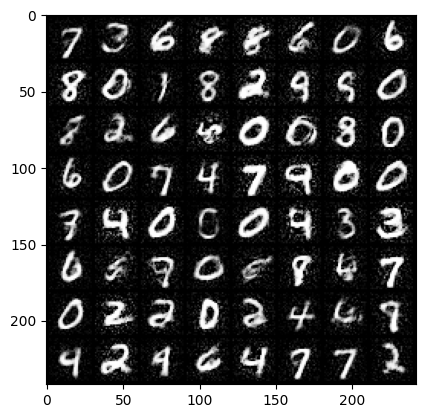

Epoch [76/80] Batch [0/1875]             Loss D: 0.3165, Loss G: 3.4596
Epoch [76/80] Batch [100/1875]             Loss D: 0.2802, Loss G: 3.1953
Epoch [76/80] Batch [200/1875]             Loss D: 0.5222, Loss G: 3.7240
Epoch [76/80] Batch [300/1875]             Loss D: 0.2191, Loss G: 3.2497
Epoch [76/80] Batch [400/1875]             Loss D: 0.4879, Loss G: 3.1316
Epoch [76/80] Batch [500/1875]             Loss D: 0.4124, Loss G: 2.9822
Epoch [76/80] Batch [600/1875]             Loss D: 0.4904, Loss G: 2.7575
Epoch [76/80] Batch [700/1875]             Loss D: 0.5030, Loss G: 3.6544
Epoch [76/80] Batch [800/1875]             Loss D: 0.4601, Loss G: 3.1732
Epoch [76/80] Batch [900/1875]             Loss D: 0.4329, Loss G: 3.0138
Epoch [76/80] Batch [1000/1875]             Loss D: 0.5834, Loss G: 2.8357
Epoch [76/80] Batch [1100/1875]             Loss D: 0.3018, Loss G: 2.9485
Epoch [76/80] Batch [1200/1875]             Loss D: 0.3489, Loss G: 2.7914
Epoch [76/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.87945473..1.0].


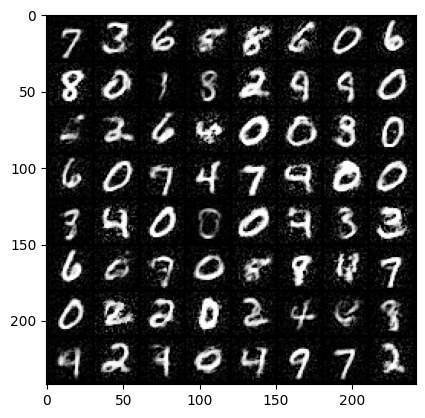

Epoch [77/80] Batch [0/1875]             Loss D: 0.3830, Loss G: 2.7562
Epoch [77/80] Batch [100/1875]             Loss D: 0.4441, Loss G: 2.6487
Epoch [77/80] Batch [200/1875]             Loss D: 0.2976, Loss G: 3.0450
Epoch [77/80] Batch [300/1875]             Loss D: 0.4202, Loss G: 2.4436
Epoch [77/80] Batch [400/1875]             Loss D: 0.3727, Loss G: 2.7327
Epoch [77/80] Batch [500/1875]             Loss D: 0.4277, Loss G: 3.0436
Epoch [77/80] Batch [600/1875]             Loss D: 0.3165, Loss G: 2.9878
Epoch [77/80] Batch [700/1875]             Loss D: 0.2910, Loss G: 3.2137
Epoch [77/80] Batch [800/1875]             Loss D: 0.3187, Loss G: 3.1396
Epoch [77/80] Batch [900/1875]             Loss D: 0.7027, Loss G: 2.8171
Epoch [77/80] Batch [1000/1875]             Loss D: 0.6424, Loss G: 2.5657
Epoch [77/80] Batch [1100/1875]             Loss D: 0.2008, Loss G: 3.2418
Epoch [77/80] Batch [1200/1875]             Loss D: 0.4239, Loss G: 3.6855
Epoch [77/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9535487..0.9999998].


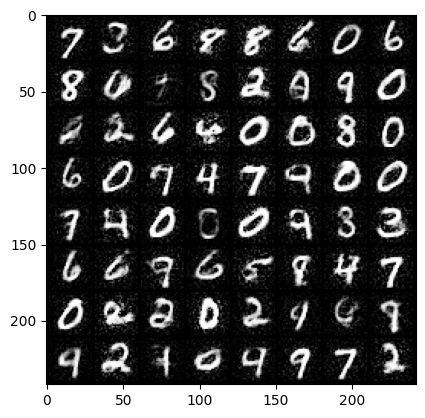

Epoch [78/80] Batch [0/1875]             Loss D: 0.4017, Loss G: 3.8939
Epoch [78/80] Batch [100/1875]             Loss D: 0.5548, Loss G: 2.4974
Epoch [78/80] Batch [200/1875]             Loss D: 0.3733, Loss G: 3.3037
Epoch [78/80] Batch [300/1875]             Loss D: 0.4198, Loss G: 2.7772
Epoch [78/80] Batch [400/1875]             Loss D: 0.3896, Loss G: 3.6071
Epoch [78/80] Batch [500/1875]             Loss D: 0.3707, Loss G: 2.9617
Epoch [78/80] Batch [600/1875]             Loss D: 0.3563, Loss G: 2.6770
Epoch [78/80] Batch [700/1875]             Loss D: 0.4883, Loss G: 3.4822
Epoch [78/80] Batch [800/1875]             Loss D: 0.4000, Loss G: 2.7870
Epoch [78/80] Batch [900/1875]             Loss D: 0.4403, Loss G: 2.7845
Epoch [78/80] Batch [1000/1875]             Loss D: 0.4595, Loss G: 3.5431
Epoch [78/80] Batch [1100/1875]             Loss D: 0.6755, Loss G: 3.5224
Epoch [78/80] Batch [1200/1875]             Loss D: 0.3805, Loss G: 3.4087
Epoch [78/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9591518..0.9999999].


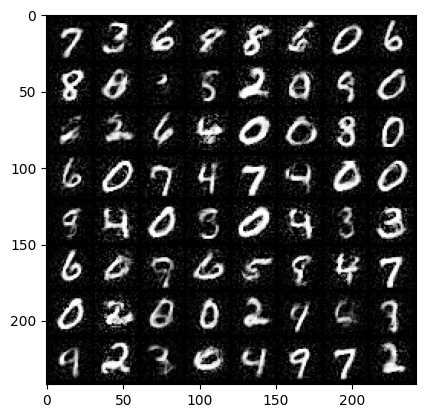

Epoch [79/80] Batch [0/1875]             Loss D: 0.4219, Loss G: 3.2982
Epoch [79/80] Batch [100/1875]             Loss D: 0.5450, Loss G: 3.3378
Epoch [79/80] Batch [200/1875]             Loss D: 0.3884, Loss G: 3.4752
Epoch [79/80] Batch [300/1875]             Loss D: 0.2967, Loss G: 3.1262
Epoch [79/80] Batch [400/1875]             Loss D: 0.3684, Loss G: 3.7617
Epoch [79/80] Batch [500/1875]             Loss D: 0.8020, Loss G: 3.4214
Epoch [79/80] Batch [600/1875]             Loss D: 0.4922, Loss G: 3.2968
Epoch [79/80] Batch [700/1875]             Loss D: 0.3971, Loss G: 3.7623
Epoch [79/80] Batch [800/1875]             Loss D: 0.7573, Loss G: 3.9203
Epoch [79/80] Batch [900/1875]             Loss D: 0.3025, Loss G: 2.9716
Epoch [79/80] Batch [1000/1875]             Loss D: 0.5294, Loss G: 2.9814
Epoch [79/80] Batch [1100/1875]             Loss D: 0.4353, Loss G: 2.5925
Epoch [79/80] Batch [1200/1875]             Loss D: 0.3792, Loss G: 3.2641
Epoch [79/80] Batch [1300/1875]      

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9082885..1.0].


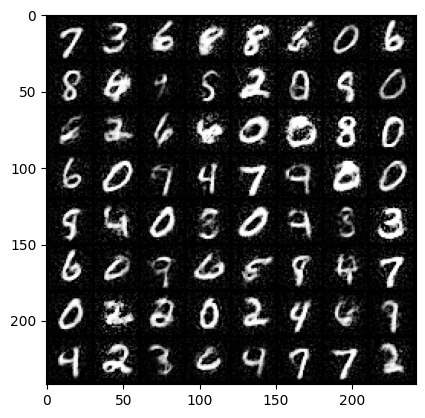

In [ ]:
# Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64, 100)

for epoch in range(num_epochs):
    for i, (data, _) in enumerate(trainloader):
        real_data = data
        batch_size = real_data.size(0)
        
        # Train the discriminator
        # Generate fake data
        noise = torch.randn(batch_size, 100)  # Ensure the same batch size for noise
        fake_data = generator(noise)

        label_real = torch.full((batch_size,), 1, dtype=torch.float)
        label_fake = torch.full((batch_size,), 0, dtype=torch.float)

        output_real = discriminator(real_data).view(-1)
        lossD_real = criterion(output_real, label_real)

        output_fake = discriminator(fake_data.detach()).view(-1)
        lossD_fake = criterion(output_fake, label_fake)

        lossD = lossD_real + lossD_fake

        OptimizerD.zero_grad()
        lossD.backward(retain_graph=True)  # Retain the graph for the generator backward pass
        OptimizerD.step()

        # Train the generator
        output_fake = discriminator(fake_data).view(-1)
        lossG = criterion(output_fake, label_real)
        OptimizerG.zero_grad()
        lossG.backward()  # Now this works since the graph is retained
        OptimizerG.step()

        # Visualizing the results of the training
        if i % 100 == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(trainloader)}] \
            Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}")

    with torch.no_grad():
        fake_images = generator(fixed_noise).detach()
    
    img_grid = torchvision.utils.make_grid(fake_images)  # (channel, height, width)
    np_img = img_grid.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))  # (Height, Width, Channel)
    plt.show()
